This notebook (notebook 3) is to illustrate how cliamte data was formed using google earth engine and how we processed them. Note that we have already provided the processed data in 1_data/climate_data folders. There may be some mismatch in the names of data folders (and names of files) because folder strucutre have been, but the methodology is as shown below.
We need few functions from some python file (.py) in '2_scripts' folder.

# Set up

In [ ]:
#@title Install pacakges

!pip install geojson
!pip install rasterio

In [ ]:
#@title Load pacakges
import os

import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import plotly.graph_objects as go

import geopandas as gpd
from shapely.geometry import Point

from glob import glob


import geojson
from pprint import pprint
import rasterio
from rasterio.mask import mask
import rasterio.plot as rioplot
from sklearn import metrics

import time

import geemap.core as geemap
from datetime import datetime
import folium
from folium.features import GeoJsonTooltip
from folium.features import DivIcon

# preferences
%matplotlib inline
mpl.style.use('ggplot')

In [ ]:
#@title Set directory

from google.colab import drive
drive.mount('/content/drive/')
print(sorted(os.listdir()))
try:
  os.chdir('/content/.....') #set to your directory path
  print(sorted(os.listdir()))
except:
  print("GGDrive may not have been updated, wait and retry")

In [ ]:
#@title Add system path for scripts

import sys

if '2_scripts' not in sys.path:
    sys.path.append('2_scripts')
print(sys.path)

In [ ]:
#@title Authenticate Earth Engine project

import ee
ee.Authenticate()
ee.Initialize(project='resolute-casing-460516-k8')

In [ ]:
#@title import from scripts

import importlib


import preprocess_climatedata as pc
importlib.reload(pc)
import visualisation_climatedata as vc
importlib.reload(vc)


# Set 1 - 2: Create climatic dataset of ERA5_LAND



*   We will select 11 bands from ECMWF/ERA5_LAND/MONTHLY_AGGR for export, and it will be used seperately for creating the equivalent of sample-with-data format (annotate each point with climate from their corresponding month-year) or used aggregatedly by mean (annotate each point with climate from aggregated rasters i.e. assume that long-term averages are representative)
* We will extract the data from 2013-2024
* To annotate each point with climate from their corresponding month-year data, we have to extract 2013-2024 collections (and not aggregate)
* To annotate each point with long-term data, we will use the 2013-2024 (12years) collections and aggregate them together



In [ ]:
#@title Call ERA5_LAND from GEE and define bands to export

era5land1324 = ee.ImageCollection('ECMWF/ERA5_LAND/MONTHLY_AGGR') \
    .filterDate('2013-01-01', '2024-12-31')
#@title define bands to export
era5land_bands = era5land1324.first().bandNames().getInfo()
bandsexport_era5land = ['temperature_2m','temperature_2m_min', 'temperature_2m_max', 'surface_pressure',
                            'dewpoint_temperature_2m','total_precipitation_sum', 'u_component_of_wind_10m', 'v_component_of_wind_10m',
                    'total_evaporation_sum','soil_temperature_level_1', 'volumetric_soil_water_layer_1',
                   'leaf_area_index_low_vegetation']

## Define boundaries

In [ ]:
import geojson

with open('data/spatial_data/pnv_vecea_excludeWDDa_dissolved_extend.geojson', 'r') as file:
  geojson_data = geojson.load(file)

ee_geometries_1 = [pc.feature_to_ee_geometry(feature) for feature in geojson_data['features']]
ee_geometries = [geom for geom in ee_geometries_1 if geom is not None]

print(f"Converted {len(ee_geometries)} geometries to Earth Engine.")

boundary = ee.FeatureCollection(ee_geometries)

Converted 1 geometries to Earth Engine.


In [ ]:
import folium
# Create a folium map centered around your boundary
center = [37.91167644477426, 0.4622281086351691] #boundary.geometry().centroid().coordinates().getInfo()
m = folium.Map(location=[center[1], center[0]], zoom_start=6)

# Define a visualization style for the boundary
boundary_style = {'color': 'red', 'fillColor': '00000000'}

# Add the boundary layer to the folium map
folium.GeoJson(
    data=boundary.getInfo(),
    style_function=lambda x: boundary_style
).add_to(m)

# Display the map
m

In [ ]:
savefigpath = 'notebooks/Images_from_notebooks/notebook_03'
os.makedirs(savefigpath, exist_ok=True)
m.save(f"{savefigpath}/boundary_FeatureCollection_map.html")

## Export

In [ ]:
#@title 1.1 gee_avg_era5land
collection = era5land1324
boundary = boundary
bands_to_export = bandsexport_era5land
output_dir = 'new_gee_avg_era5land'

pc.gee_export_avg(collection, boundary ,bands_to_export, output_dir=output_dir, method = 'mean', export_scale = 9000, nodata_value = -9999, asctask = False)


Started export task for temperature_2m (GeoTIFF). Task ID: 2ZCLIS6JNXPFW2V4GG4P6WOC
Started export task for temperature_2m_min (GeoTIFF). Task ID: GVFZDOJVZPK6K56W6DHI2F2S
Started export task for temperature_2m_max (GeoTIFF). Task ID: YHGQGG25WGSIJSFTID5YGV3K
Started export task for surface_pressure (GeoTIFF). Task ID: IRISTLGTHST3FOM3XSCPUZYY
Started export task for dewpoint_temperature_2m (GeoTIFF). Task ID: PBQUWBFYA55INN76JRKQFJNV
Started export task for total_precipitation_sum (GeoTIFF). Task ID: IEP3STKMH3O7NCGRKKYSOKBF
Started export task for u_component_of_wind_10m (GeoTIFF). Task ID: ZKVVBCDDE6N5VZARWXXMGFED
Started export task for v_component_of_wind_10m (GeoTIFF). Task ID: LLTZOFS5XYZJKVPE32FIF7JV
Started export task for total_evaporation_sum (GeoTIFF). Task ID: TPDEKAMGQQNNMZAAQMP7Z5YU
Started export task for soil_temperature_level_1 (GeoTIFF). Task ID: BJORQJQKFOOWIJQODGXFNLEC
Started export task for volumetric_soil_water_layer_1 (GeoTIFF). Task ID: PNITGBGMUQJUCJ72SH64JGR

data/climate_data/climate_raw_data/new_gee_avg_era5land/temperature_2m_raster_tif.tif

--- Checking Raster: data/climate_data/climate_raw_data/new_gee_avg_era5land/temperature_2m_raster_tif.tif ---
Pixel size (width, height): (0.08084837557075693, 0.08084837557075693)
Raster's official NoData value (if set): -9999.0
Using NoData value for counting: -9999.0
Total number of pixels: 12100
Number of valid pixels: 11286
Percentage of valid pixels: 93.27%
--- End Check ---
data/climate_data/climate_raw_data/new_gee_avg_era5land/temperature_2m_min_raster_tif.tif

--- Checking Raster: data/climate_data/climate_raw_data/new_gee_avg_era5land/temperature_2m_min_raster_tif.tif ---
Pixel size (width, height): (0.08084837557075693, 0.08084837557075693)
Raster's official NoData value (if set): -9999.0
Using NoData value for counting: -9999.0
Total number of pixels: 12100
Number of valid pixels: 11286
Percentage of valid pixels: 93.27%
--- End Check ---
data/climate_data/climate_raw_data/new_gee_avg_e

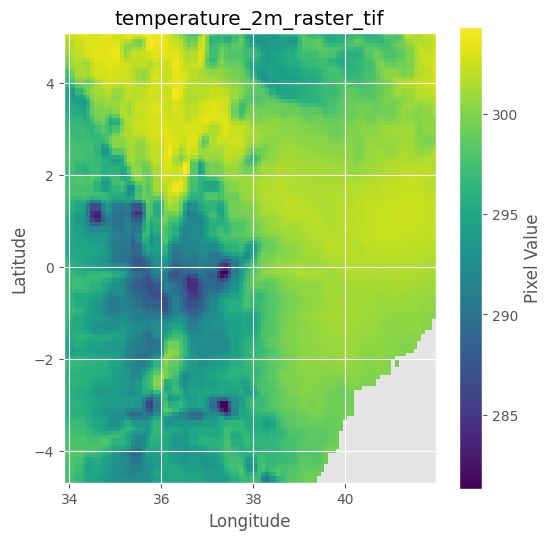


📂 Processing: data/climate_data/climate_raw_data/new_gee_avg_era5land/temperature_2m_min_raster_tif.tif
   ↪ src.nodata: -9999.0
✅ raster_nodata is not None
🟢 Using src.nodata from metadata


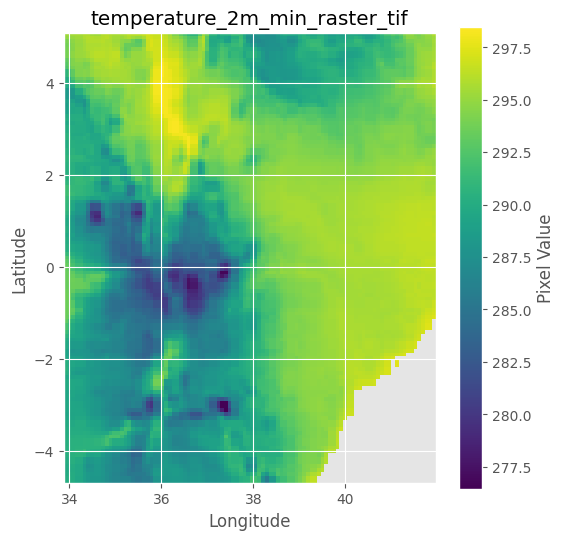


📂 Processing: data/climate_data/climate_raw_data/new_gee_avg_era5land/temperature_2m_max_raster_tif.tif
   ↪ src.nodata: -9999.0
✅ raster_nodata is not None
🟢 Using src.nodata from metadata


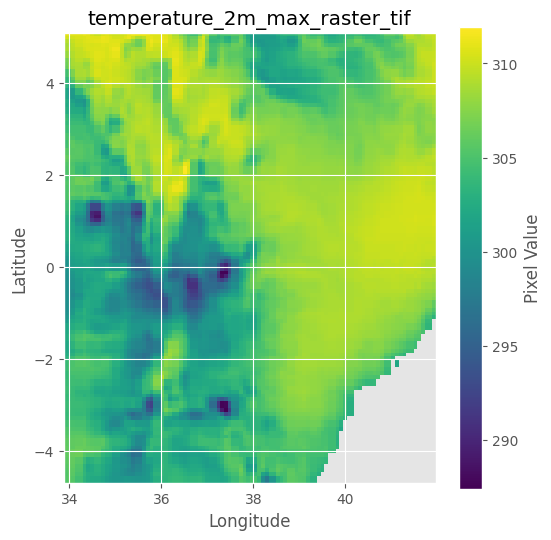


📂 Processing: data/climate_data/climate_raw_data/new_gee_avg_era5land/surface_pressure_raster_tif.tif
   ↪ src.nodata: -9999.0
✅ raster_nodata is not None
🟢 Using src.nodata from metadata


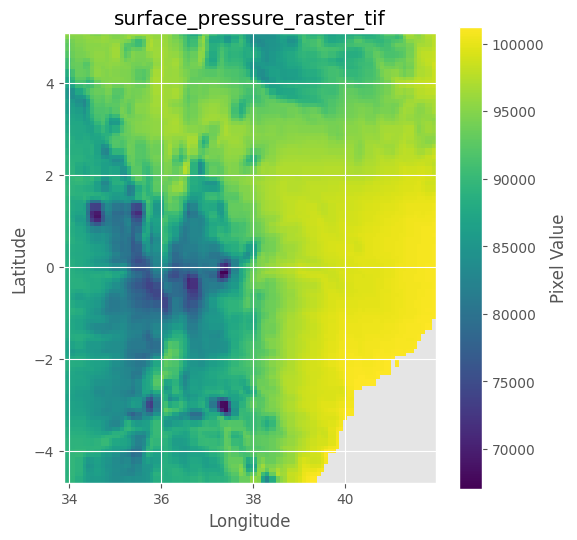


📂 Processing: data/climate_data/climate_raw_data/new_gee_avg_era5land/total_precipitation_sum_raster_tif.tif
   ↪ src.nodata: -9999.0
✅ raster_nodata is not None
🟢 Using src.nodata from metadata


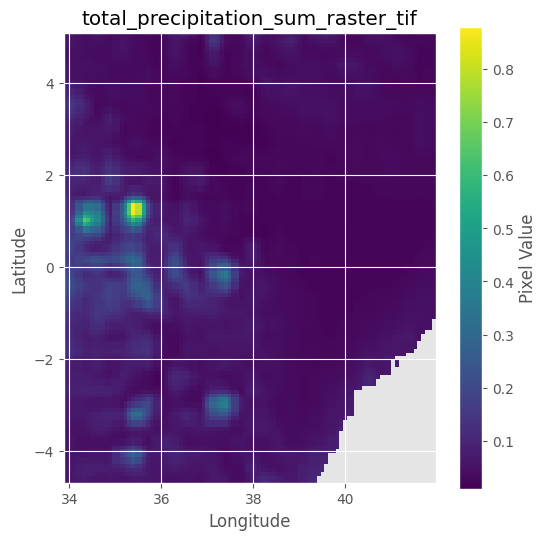


📂 Processing: data/climate_data/climate_raw_data/new_gee_avg_era5land/u_component_of_wind_10m_raster_tif.tif
   ↪ src.nodata: -9999.0
✅ raster_nodata is not None
🟢 Using src.nodata from metadata


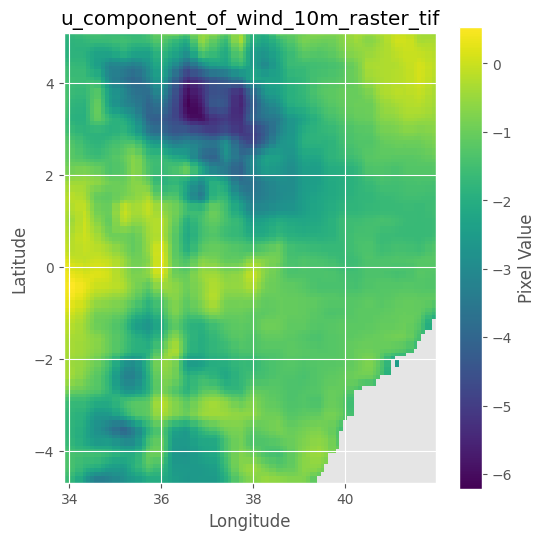


📂 Processing: data/climate_data/climate_raw_data/new_gee_avg_era5land/dewpoint_temperature_2m_raster_tif.tif
   ↪ src.nodata: -9999.0
✅ raster_nodata is not None
🟢 Using src.nodata from metadata


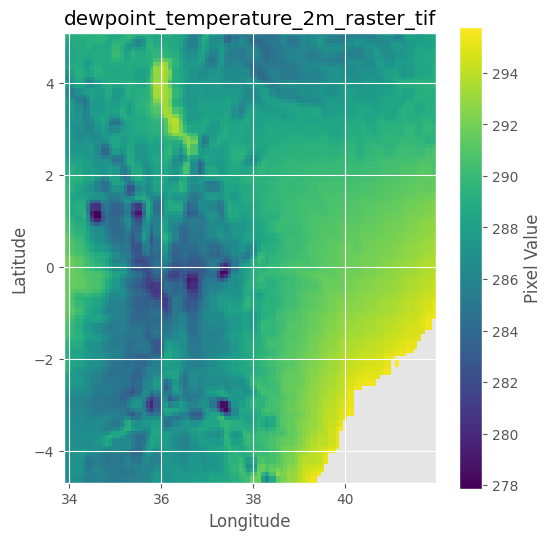


📂 Processing: data/climate_data/climate_raw_data/new_gee_avg_era5land/v_component_of_wind_10m_raster_tif.tif
   ↪ src.nodata: -9999.0
✅ raster_nodata is not None
🟢 Using src.nodata from metadata


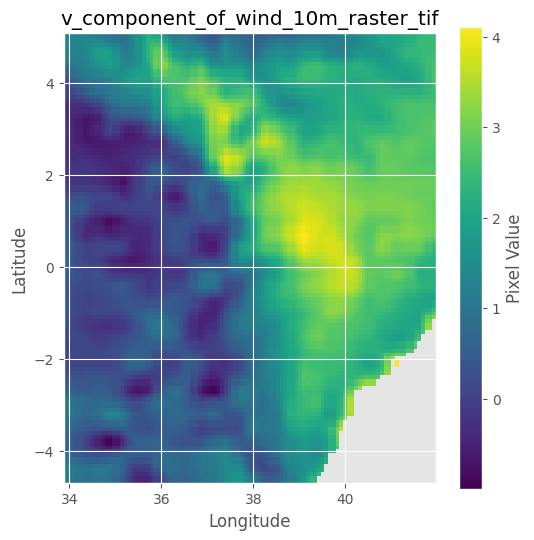


📂 Processing: data/climate_data/climate_raw_data/new_gee_avg_era5land/total_evaporation_sum_raster_tif.tif
   ↪ src.nodata: -9999.0
✅ raster_nodata is not None
🟢 Using src.nodata from metadata


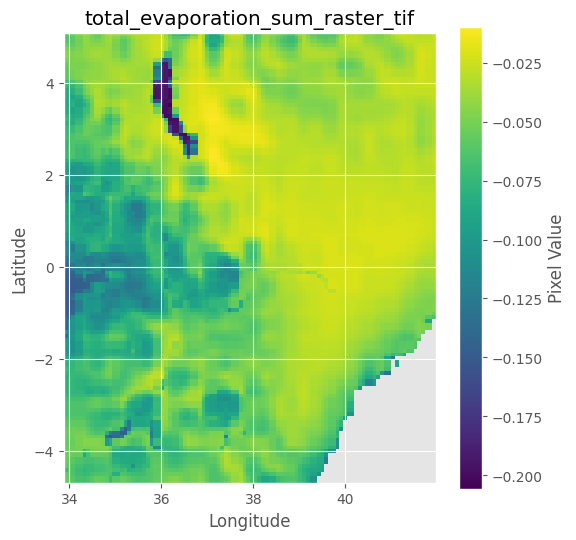


📂 Processing: data/climate_data/climate_raw_data/new_gee_avg_era5land/soil_temperature_level_1_raster_tif.tif
   ↪ src.nodata: -9999.0
✅ raster_nodata is not None
🟢 Using src.nodata from metadata


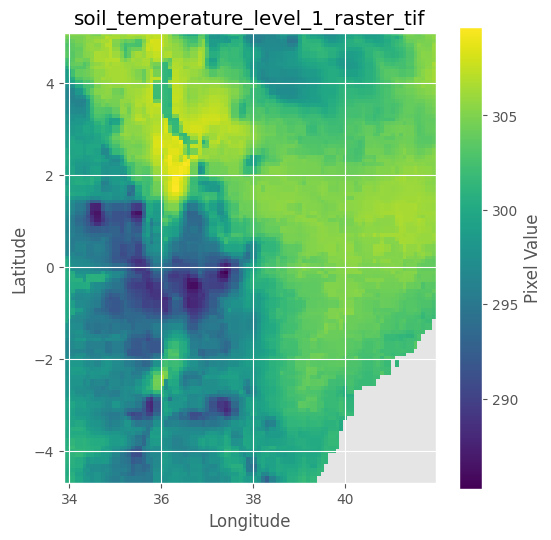


📂 Processing: data/climate_data/climate_raw_data/new_gee_avg_era5land/volumetric_soil_water_layer_1_raster_tif.tif
   ↪ src.nodata: -9999.0
✅ raster_nodata is not None
🟢 Using src.nodata from metadata


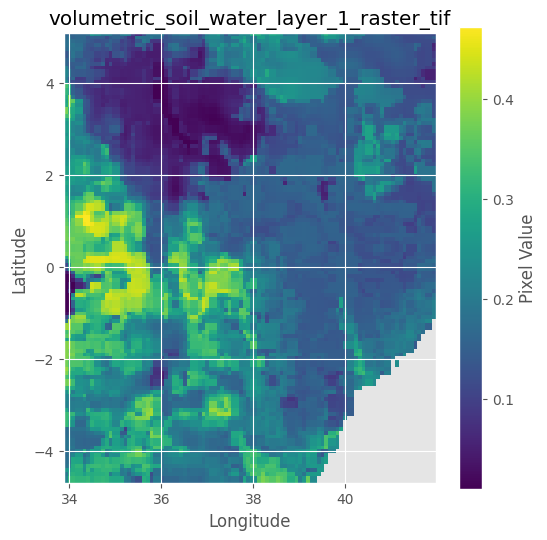


📂 Processing: data/climate_data/climate_raw_data/new_gee_avg_era5land/leaf_area_index_low_vegetation_raster_tif.tif
   ↪ src.nodata: -9999.0
✅ raster_nodata is not None
🟢 Using src.nodata from metadata


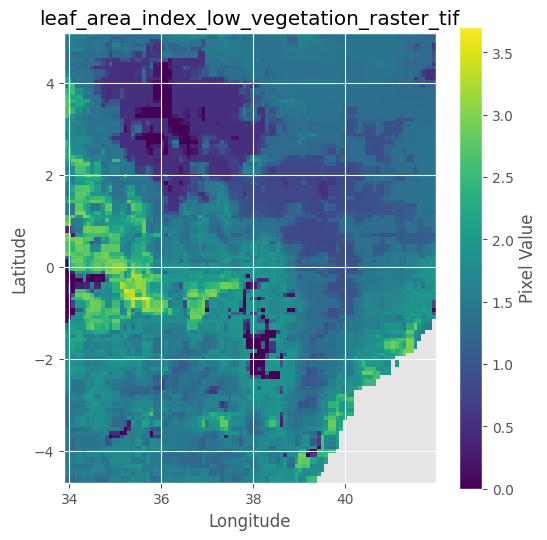

In [ ]:
#@title 1.2 check and visualise gee_avg_era5land
# pc.check_raster_properties('new_gee_avg_era5land')

folder = 'data/climate_data/climate_raw_data/new_gee_avg_era5land'
for raster in glob(os.path.join(f'{folder}/*.tif')):
  print(raster)
  pc.check_raster_properties(raster, nodata_value=-9999) # Raster's official NoData value (if set): -9999
vc.visualise_rasters(
    path=folder,
    nodata_value=  -9999, output_folder='raster_plots/01', show_plot=True, save_plot=False
)

In [ ]:
year_month_df = pd.read_csv('data/faw_data/faw_processed_data/faw_presence_YearMonth_dist.csv')
year_month_col = year_month_df['YearMonth']
year_month_list = year_month_col.to_list()
year_month_list

['2013-06',
 '2015-06',
 '2015-10',
 '2016-06',
 '2016-07',
 '2017-01',
 '2017-03',
 '2017-04',
 '2017-05',
 '2017-06',
 '2017-07',
 '2017-08',
 '2017-09',
 '2017-10',
 '2017-11',
 '2017-12',
 '2018-01',
 '2018-02',
 '2018-03',
 '2018-04',
 '2018-05',
 '2018-06',
 '2018-07',
 '2018-08',
 '2018-09',
 '2018-10',
 '2018-11',
 '2018-12',
 '2019-01',
 '2019-02',
 '2019-03',
 '2019-04',
 '2019-05',
 '2019-06',
 '2019-07',
 '2019-08',
 '2019-09',
 '2019-10',
 '2019-11',
 '2019-12',
 '2020-01',
 '2020-02',
 '2020-03',
 '2020-04',
 '2020-05',
 '2020-06',
 '2020-07',
 '2020-10',
 '2020-11',
 '2020-12',
 '2021-01',
 '2021-02',
 '2021-03',
 '2021-04',
 '2021-05',
 '2021-06',
 '2021-07',
 '2021-08',
 '2021-10',
 '2021-11',
 '2021-12',
 '2022-01',
 '2022-02',
 '2022-06',
 '2022-11',
 '2022-12',
 '2023-01',
 '2023-04',
 '2023-05',
 '2023-06',
 '2024-05',
 '2024-11',
 '2025-05']

In [ ]:
#@title 2.1 gee_selected_months_era5land
# collection = era5land1324
collection_id = 'ECMWF/ERA5_LAND/MONTHLY_AGGR'
boundary = boundary
bands_to_export = bandsexport_era5land
output_dir = 'new_gee_selected_months_era5land'
year_month_list = year_month_list
pc.gee_export_selected_months(collection_id, boundary, bands_to_export, year_month_list,
                           output_dir=output_dir, export_scale=9000, nodata_value=-9999)

[EXPORTING] MONTHLY_AGGR_2013_06 (Task ID: QGUO4GWVZLU4KN52DCUGTK7W)
[EXPORTING] MONTHLY_AGGR_2015_06 (Task ID: FB2TKKHD3QFAYTWQL7H3DZTK)
[EXPORTING] MONTHLY_AGGR_2015_10 (Task ID: XIK7TRTYWDSXT57LJUWCVXMN)
[EXPORTING] MONTHLY_AGGR_2016_06 (Task ID: H35UMELN5N3COYYWWKQM63WT)
[EXPORTING] MONTHLY_AGGR_2016_07 (Task ID: 5NXUTUZPXCFAG76R7WGWQHIG)
[EXPORTING] MONTHLY_AGGR_2017_01 (Task ID: AKRHCSFDHDLPKVZMRYKNRM3E)
[EXPORTING] MONTHLY_AGGR_2017_03 (Task ID: YP5KYYTWT2Y5B6WY3IMCI73H)
[EXPORTING] MONTHLY_AGGR_2017_04 (Task ID: M27WEU7LCPOD362W2JKTUALJ)
[EXPORTING] MONTHLY_AGGR_2017_05 (Task ID: UM2HKK76IJNOXIES2A5MHZVI)
[EXPORTING] MONTHLY_AGGR_2017_06 (Task ID: EZXC76MJWYOZH5ORMVBNM6JX)
[EXPORTING] MONTHLY_AGGR_2017_07 (Task ID: 4TVTB6Q2JA7STFCMD7GWHL6N)
[EXPORTING] MONTHLY_AGGR_2017_08 (Task ID: EURJT4CBCF575VI7SWX2DJSZ)
[EXPORTING] MONTHLY_AGGR_2017_09 (Task ID: 4RLMBBAUGF6NDOVUPLE5RU4J)
[EXPORTING] MONTHLY_AGGR_2017_10 (Task ID: 3Q6CNBTXETEYAGBPGPJHOOMZ)
[EXPORTING] MONTHLY_AGGR_2017_11 (

[EXPORTING] MONTHLY_AGGR_2022_01 (Task ID: ASV76OVGBRJUZVARPGS4X2W2)
[EXPORTING] MONTHLY_AGGR_2022_02 (Task ID: X4BCFWMN5P5IY7HMZTXL7R2F)
[EXPORTING] MONTHLY_AGGR_2022_06 (Task ID: 3LP5H3WIF66MJBA34VVPPK2H)
[EXPORTING] MONTHLY_AGGR_2022_11 (Task ID: 2CM4GBQDHES2KVHLFQPGOK4X)
[EXPORTING] MONTHLY_AGGR_2022_12 (Task ID: JYD7AZSJBQPOBMW73OMHMUKE)
[EXPORTING] MONTHLY_AGGR_2023_01 (Task ID: OAIMBGIYHOFUFKSFS5UA5J6F)
[EXPORTING] MONTHLY_AGGR_2023_04 (Task ID: C43XW6HFW2THNONV5DNA5R2G)
[EXPORTING] MONTHLY_AGGR_2023_05 (Task ID: ZL4RMQCOAPTF7AC2ES7KNOEA)
[EXPORTING] MONTHLY_AGGR_2023_06 (Task ID: VTVHY4RO6C2DVEJPLVWT6X4E)
[EXPORTING] MONTHLY_AGGR_2024_05 (Task ID: VRSCYZYNI4BNYQUDZVZETQJ4)
[EXPORTING] MONTHLY_AGGR_2024_11 (Task ID: 2YO4EIYAAGPPAX66ZPHLHXAZ)
[EXPORTING] MONTHLY_AGGR_2025_05 (Task ID: XDLP62BZ6AK4CD4ELJHJVOVC)


data/climate_data/climate_raw_data/new_gee_selected_months_era5land/MONTHLY_AGGR_2013_06.tif

--- Checking Raster: data/climate_data/climate_raw_data/new_gee_selected_months_era5land/MONTHLY_AGGR_2013_06.tif ---
Pixel size (width, height): (0.08084837557075693, 0.08084837557075693)
Raster's official NoData value (if set): -9999.0
Using NoData value for counting: -9999.0
Total number of pixels: 12100
Number of valid pixels: 11277
Percentage of valid pixels: 93.20%
--- End Check ---
data/climate_data/climate_raw_data/new_gee_selected_months_era5land/MONTHLY_AGGR_2015_06.tif

--- Checking Raster: data/climate_data/climate_raw_data/new_gee_selected_months_era5land/MONTHLY_AGGR_2015_06.tif ---
Pixel size (width, height): (0.08084837557075693, 0.08084837557075693)
Raster's official NoData value (if set): -9999.0
Using NoData value for counting: -9999.0
Total number of pixels: 12100
Number of valid pixels: 11277
Percentage of valid pixels: 93.20%
--- End Check ---
data/climate_data/climate_ra

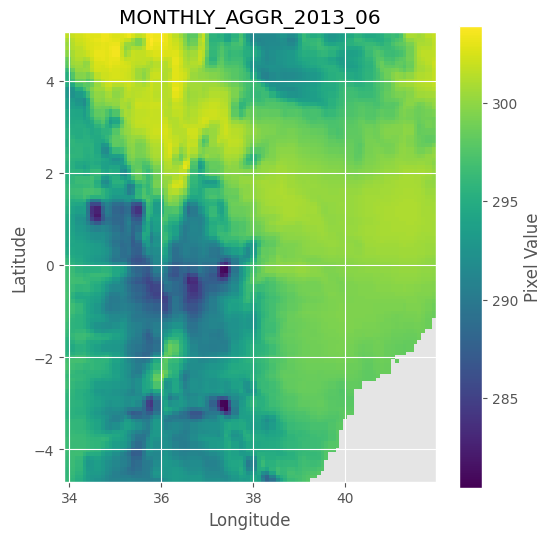


Processing: data/climate_data/climate_raw_data/new_gee_selected_months_era5land/MONTHLY_AGGR_2015_06.tif
raster src.nodata -9999.0


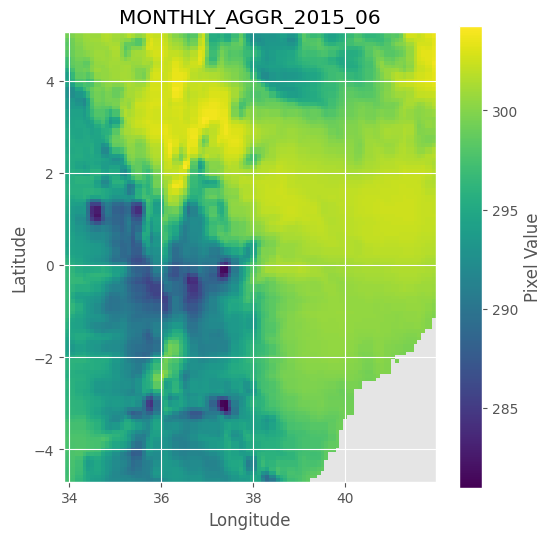


Processing: data/climate_data/climate_raw_data/new_gee_selected_months_era5land/MONTHLY_AGGR_2015_10.tif
raster src.nodata -9999.0


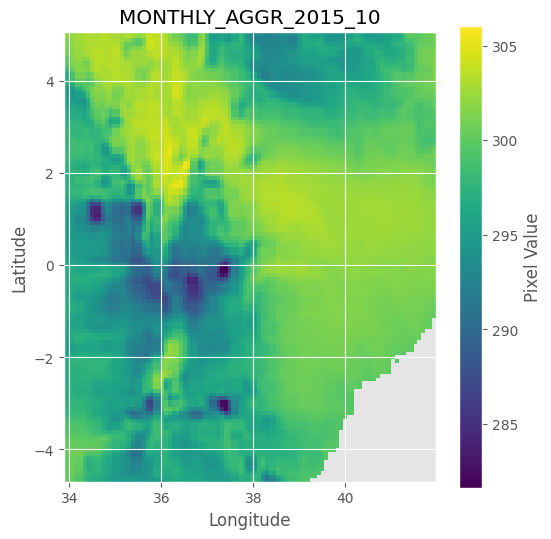

In [ ]:
#@title 2.2 check and visualise gee_selected_months_era5land


folder = 'data/climate_data/climate_raw_data/new_gee_selected_months_era5land'

tifs = sorted(glob(os.path.join(folder, '*.tif')))[:3]

for raster in tifs:
  print(raster)
  pc.check_raster_properties(raster, nodata_value=-9999) # Raster's official NoData value (if set): -9999
vc.visualise_rasters_lim(
    folder_path= folder,
    nodata_value=  -9999, output_folder='raster_plots/01', show_plot=True, save_plot=False, max_files=3
)

## Re-import to clip to landscape

In [ ]:
#@title add landscape
pnv_vecea_excludeWDDa_dissolved_extend_file = "data/spatial_data/pnv_vecea_excludeWDDa_dissolved_extend.geojson"
pnv_vecea_excludeWDDa_dissolved_extend_gdf = gpd.read_file(pnv_vecea_excludeWDDa_dissolved_extend_file)  # Or .shp
landscape_gdf = pnv_vecea_excludeWDDa_dissolved_extend_gdf
landscape_gdf = landscape_gdf.to_crs(epsg=4326)  # Ensure it's in lat/lon

In [ ]:

#@title 1.1 gee_avg_era5land clipping
raster_folder = 'data/climate_data/climate_raw_data/new_gee_avg_era5land'
output_folder = 'data/climate_data/climate_processed_data/new_gee_avg_era5land_clipped'
mask_gdf = landscape_gdf
pc.clip_rasters_to_tiff(raster_folder, output_folder, mask_gdf)

✅ Saved: data/climate_data/climate_processed_data/new_gee_avg_era5land_clipped/temperature_2m_min_raster_tif_clipped.tif
✅ Saved: data/climate_data/climate_processed_data/new_gee_avg_era5land_clipped/temperature_2m_raster_tif_clipped.tif
✅ Saved: data/climate_data/climate_processed_data/new_gee_avg_era5land_clipped/temperature_2m_max_raster_tif_clipped.tif
✅ Saved: data/climate_data/climate_processed_data/new_gee_avg_era5land_clipped/total_precipitation_sum_raster_tif_clipped.tif
✅ Saved: data/climate_data/climate_processed_data/new_gee_avg_era5land_clipped/surface_pressure_raster_tif_clipped.tif
✅ Saved: data/climate_data/climate_processed_data/new_gee_avg_era5land_clipped/u_component_of_wind_10m_raster_tif_clipped.tif
✅ Saved: data/climate_data/climate_processed_data/new_gee_avg_era5land_clipped/total_evaporation_sum_raster_tif_clipped.tif
✅ Saved: data/climate_data/climate_processed_data/new_gee_avg_era5land_clipped/v_component_of_wind_10m_raster_tif_clipped.tif
✅ Saved: data/climat

data/climate_data/climate_processed_data/new_gee_avg_era5land_clipped/temperature_2m_min_raster_tif_clipped.tif

--- Checking Raster: data/climate_data/climate_processed_data/new_gee_avg_era5land_clipped/temperature_2m_min_raster_tif_clipped.tif ---
Pixel size (width, height): (0.08084837557075693, 0.08084837557075693)
Raster's official NoData value (if set): -9999.0
Using NoData value for counting: -9999.0
Total number of pixels: 12100
Number of valid pixels: 6966
Percentage of valid pixels: 57.57%
--- End Check ---
data/climate_data/climate_processed_data/new_gee_avg_era5land_clipped/temperature_2m_raster_tif_clipped.tif

--- Checking Raster: data/climate_data/climate_processed_data/new_gee_avg_era5land_clipped/temperature_2m_raster_tif_clipped.tif ---
Pixel size (width, height): (0.08084837557075693, 0.08084837557075693)
Raster's official NoData value (if set): -9999.0
Using NoData value for counting: -9999.0
Total number of pixels: 12100
Number of valid pixels: 6966
Percentage of v

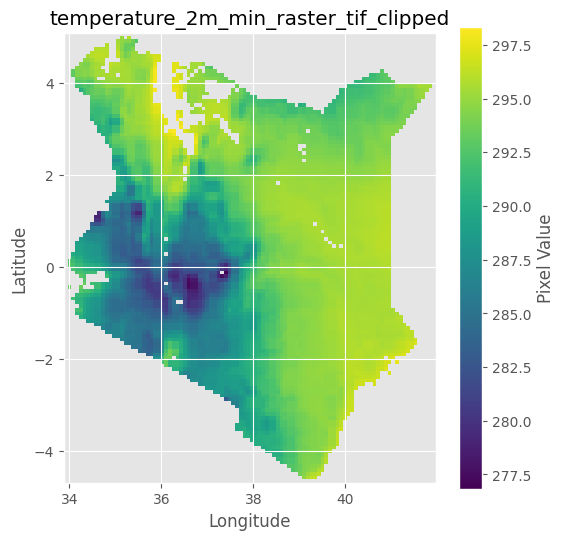


📂 Processing: data/climate_data/climate_processed_data/new_gee_avg_era5land_clipped/temperature_2m_raster_tif_clipped.tif
   ↪ src.nodata: -9999.0
✅ raster_nodata is not None
🟢 Using src.nodata from metadata


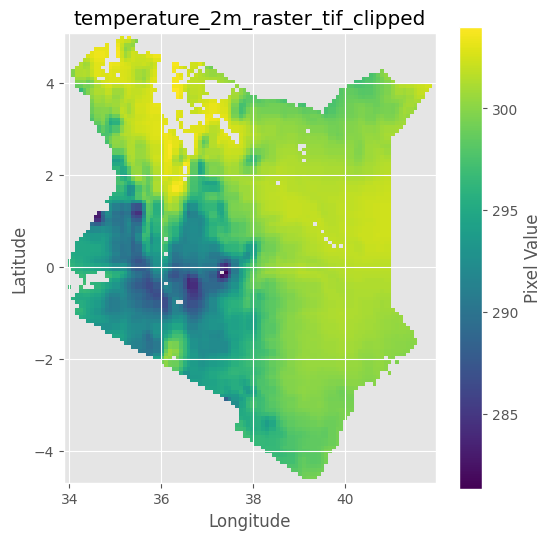


📂 Processing: data/climate_data/climate_processed_data/new_gee_avg_era5land_clipped/temperature_2m_max_raster_tif_clipped.tif
   ↪ src.nodata: -9999.0
✅ raster_nodata is not None
🟢 Using src.nodata from metadata


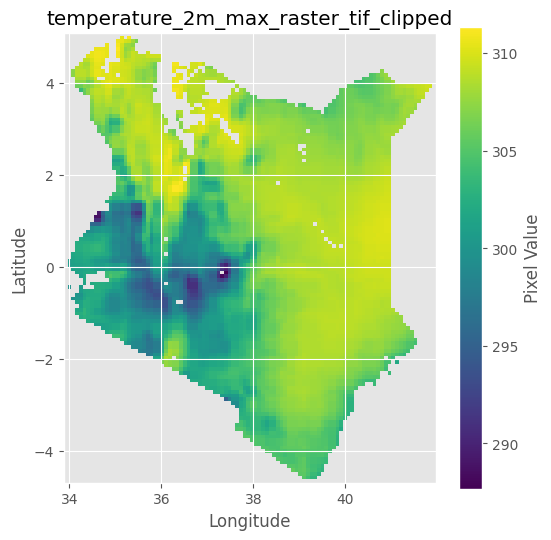


📂 Processing: data/climate_data/climate_processed_data/new_gee_avg_era5land_clipped/total_precipitation_sum_raster_tif_clipped.tif
   ↪ src.nodata: -9999.0
✅ raster_nodata is not None
🟢 Using src.nodata from metadata


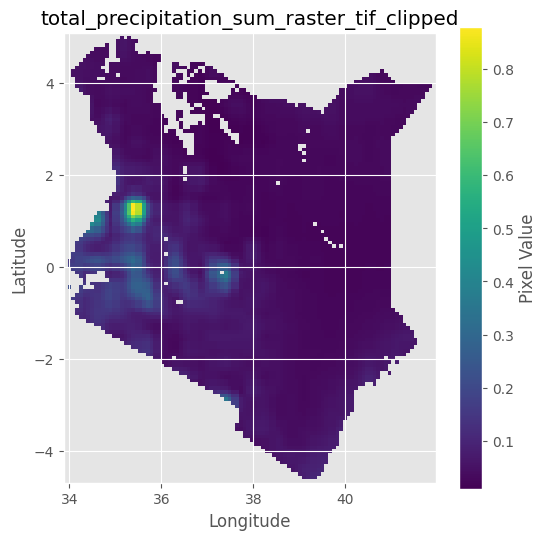


📂 Processing: data/climate_data/climate_processed_data/new_gee_avg_era5land_clipped/surface_pressure_raster_tif_clipped.tif
   ↪ src.nodata: -9999.0
✅ raster_nodata is not None
🟢 Using src.nodata from metadata


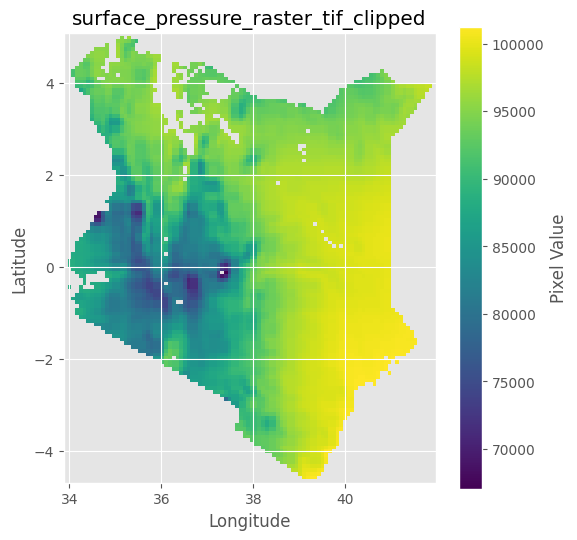


📂 Processing: data/climate_data/climate_processed_data/new_gee_avg_era5land_clipped/u_component_of_wind_10m_raster_tif_clipped.tif
   ↪ src.nodata: -9999.0
✅ raster_nodata is not None
🟢 Using src.nodata from metadata


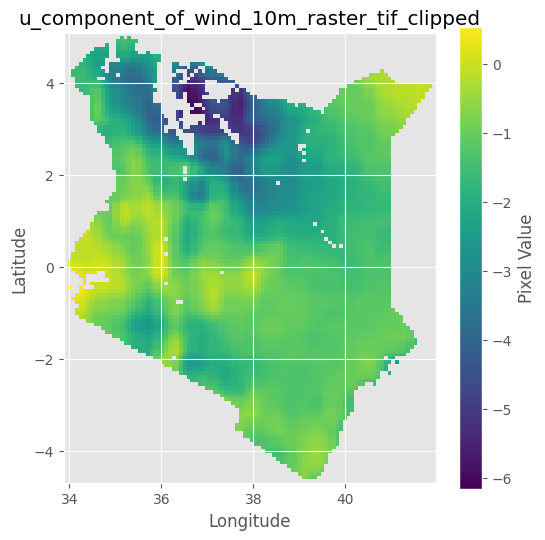


📂 Processing: data/climate_data/climate_processed_data/new_gee_avg_era5land_clipped/total_evaporation_sum_raster_tif_clipped.tif
   ↪ src.nodata: -9999.0
✅ raster_nodata is not None
🟢 Using src.nodata from metadata


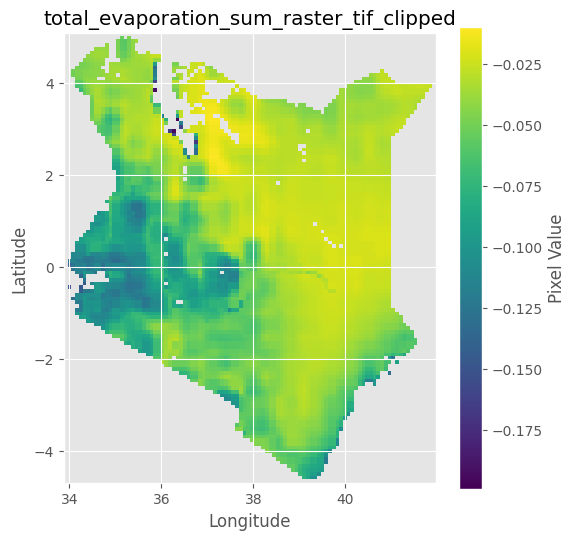


📂 Processing: data/climate_data/climate_processed_data/new_gee_avg_era5land_clipped/v_component_of_wind_10m_raster_tif_clipped.tif
   ↪ src.nodata: -9999.0
✅ raster_nodata is not None
🟢 Using src.nodata from metadata


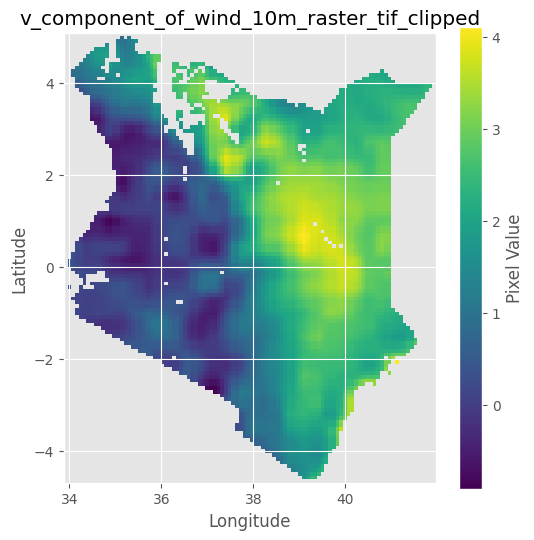


📂 Processing: data/climate_data/climate_processed_data/new_gee_avg_era5land_clipped/dewpoint_temperature_2m_raster_tif_clipped.tif
   ↪ src.nodata: -9999.0
✅ raster_nodata is not None
🟢 Using src.nodata from metadata


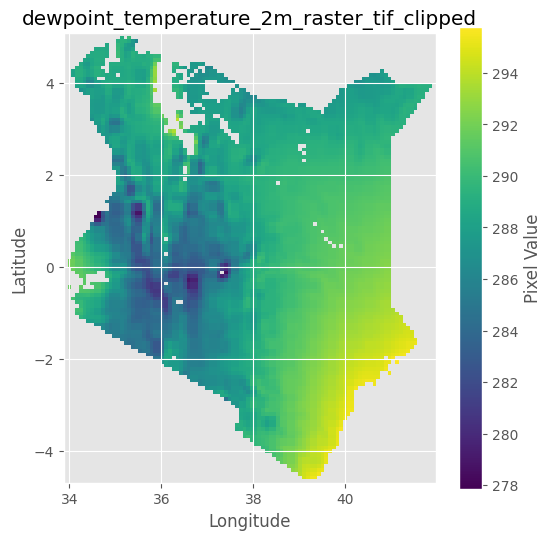


📂 Processing: data/climate_data/climate_processed_data/new_gee_avg_era5land_clipped/leaf_area_index_low_vegetation_raster_tif_clipped.tif
   ↪ src.nodata: -9999.0
✅ raster_nodata is not None
🟢 Using src.nodata from metadata


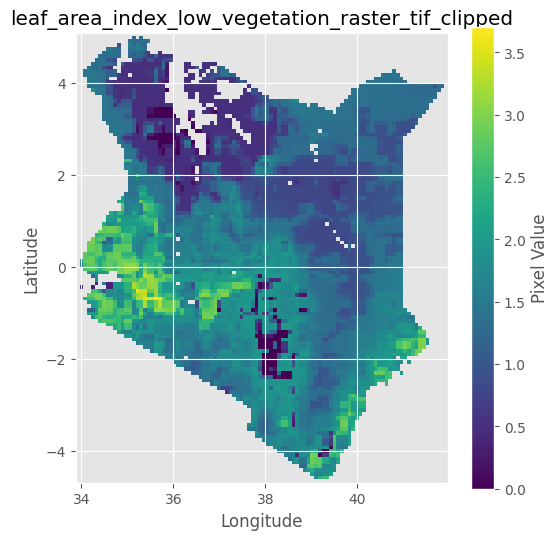


📂 Processing: data/climate_data/climate_processed_data/new_gee_avg_era5land_clipped/volumetric_soil_water_layer_1_raster_tif_clipped.tif
   ↪ src.nodata: -9999.0
✅ raster_nodata is not None
🟢 Using src.nodata from metadata


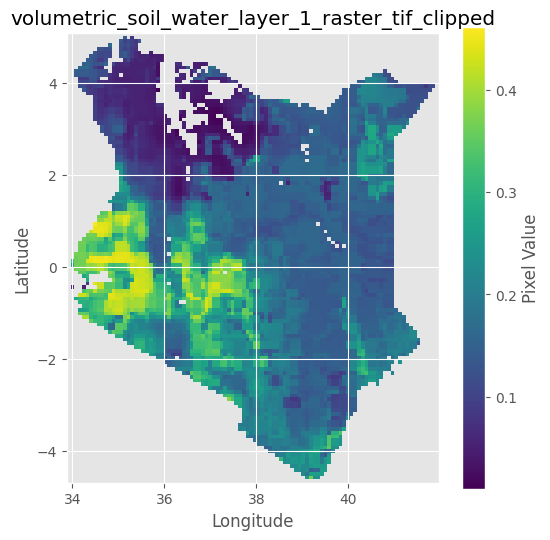


📂 Processing: data/climate_data/climate_processed_data/new_gee_avg_era5land_clipped/soil_temperature_level_1_raster_tif_clipped.tif
   ↪ src.nodata: -9999.0
✅ raster_nodata is not None
🟢 Using src.nodata from metadata


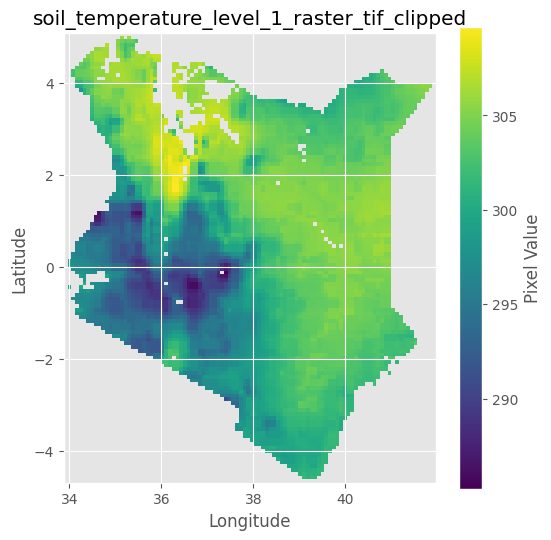

In [ ]:
#@title 1.2 check and visualise gee_avg_era5land_clipped

folder = 'data/climate_data/climate_processed_data/new_gee_avg_era5land_clipped'
for raster in glob(os.path.join(f'{folder}/*.tif')):
  print(raster)
  pc.check_raster_properties(raster, nodata_value=-9999) # Raster's official NoData value (if set): -9999
vc.visualise_rasters(
    path=folder,
    nodata_value=  -9999, output_folder='raster_plots/01', show_plot=True, save_plot=False
)

In [ ]:
#@title 2.1 gee_selected_months_era5land clipping
raster_folder = 'new_gee_selected_months_era5land'
output_folder = 'data/climate_data/climate_processed_data/new_gee_selected_months_era5land_clipped'
mask_gdf = landscape_gdf
pc.clip_rasters_to_tiff(raster_folder, output_folder, mask_gdf)

✅ Saved: data/climate_data/climate_processed_data/new_gee_selected_months_era5land_clipped/MONTHLY_AGGR_2013_06_clipped.tif
✅ Saved: data/climate_data/climate_processed_data/new_gee_selected_months_era5land_clipped/MONTHLY_AGGR_2015_06_clipped.tif
✅ Saved: data/climate_data/climate_processed_data/new_gee_selected_months_era5land_clipped/MONTHLY_AGGR_2015_10_clipped.tif
✅ Saved: data/climate_data/climate_processed_data/new_gee_selected_months_era5land_clipped/MONTHLY_AGGR_2016_06_clipped.tif
✅ Saved: data/climate_data/climate_processed_data/new_gee_selected_months_era5land_clipped/MONTHLY_AGGR_2016_07_clipped.tif
✅ Saved: data/climate_data/climate_processed_data/new_gee_selected_months_era5land_clipped/MONTHLY_AGGR_2017_01_clipped.tif
✅ Saved: data/climate_data/climate_processed_data/new_gee_selected_months_era5land_clipped/MONTHLY_AGGR_2017_03_clipped.tif
✅ Saved: data/climate_data/climate_processed_data/new_gee_selected_months_era5land_clipped/MONTHLY_AGGR_2017_04_clipped.tif
✅ Saved:

data/climate_data/climate_processed_data/new_gee_selected_months_era5land_clipped/MONTHLY_AGGR_2013_06_clipped.tif

--- Checking Raster: data/climate_data/climate_processed_data/new_gee_selected_months_era5land_clipped/MONTHLY_AGGR_2013_06_clipped.tif ---
Pixel size (width, height): (0.08084837557075693, 0.08084837557075693)
Raster's official NoData value (if set): -9999.0
Using NoData value for counting: -9999.0
Total number of pixels: 12100
Number of valid pixels: 6957
Percentage of valid pixels: 57.50%
--- End Check ---
data/climate_data/climate_processed_data/new_gee_selected_months_era5land_clipped/MONTHLY_AGGR_2015_06_clipped.tif

--- Checking Raster: data/climate_data/climate_processed_data/new_gee_selected_months_era5land_clipped/MONTHLY_AGGR_2015_06_clipped.tif ---
Pixel size (width, height): (0.08084837557075693, 0.08084837557075693)
Raster's official NoData value (if set): -9999.0
Using NoData value for counting: -9999.0
Total number of pixels: 12100
Number of valid pixels: 

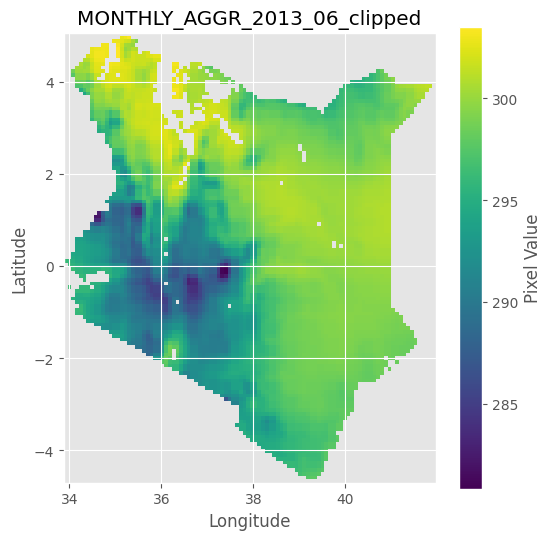


Processing: data/climate_data/climate_processed_data/new_gee_selected_months_era5land_clipped/MONTHLY_AGGR_2015_06_clipped.tif
raster src.nodata -9999.0


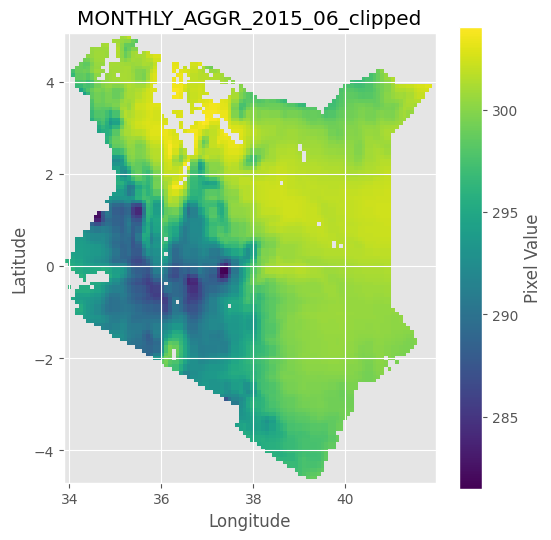


Processing: data/climate_data/climate_processed_data/new_gee_selected_months_era5land_clipped/MONTHLY_AGGR_2015_10_clipped.tif
raster src.nodata -9999.0


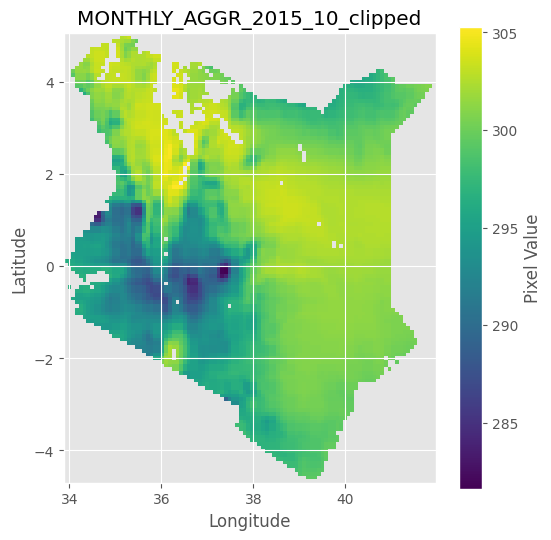

In [ ]:
#@title 2.2 check and visualise gee_selected_months_era5land_clipped

folder = 'data/climate_data/climate_processed_data/new_gee_selected_months_era5land_clipped'

tifs = sorted(glob(os.path.join(folder, '*.tif')))[:3]

for raster in tifs:
  print(raster)
  pc.check_raster_properties(raster, nodata_value=-9999) # Raster's official NoData value (if set): -9999

vc.visualise_rasters_lim(
    folder_path= folder,
    nodata_value=  -9999, output_folder='raster_plots/01', show_plot=True, save_plot=False, max_files=3
)

In [ ]:
#@title 2.3 gee_selected_months_era5land splitting folder
input_folder = 'data/climate_data/climate_processed_data/new_gee_selected_months_era5land_clipped'
output_root = 'data/climate_data/climate_processed_data/new_gee_selected_months_era5land_clipped_split_folder'
band_names = bandsexport_era5land
pc.split_multiband_rasters_by_date(input_folder, output_root, band_names)

✅ Saved: data/climate_data/climate_processed_data/new_gee_selected_months_era5land_clipped_split_folder/2013-06/temperature_2m.tif
✅ Saved: data/climate_data/climate_processed_data/new_gee_selected_months_era5land_clipped_split_folder/2013-06/temperature_2m_min.tif
✅ Saved: data/climate_data/climate_processed_data/new_gee_selected_months_era5land_clipped_split_folder/2013-06/temperature_2m_max.tif
✅ Saved: data/climate_data/climate_processed_data/new_gee_selected_months_era5land_clipped_split_folder/2013-06/surface_pressure.tif
✅ Saved: data/climate_data/climate_processed_data/new_gee_selected_months_era5land_clipped_split_folder/2013-06/dewpoint_temperature_2m.tif
✅ Saved: data/climate_data/climate_processed_data/new_gee_selected_months_era5land_clipped_split_folder/2013-06/total_precipitation_sum.tif
✅ Saved: data/climate_data/climate_processed_data/new_gee_selected_months_era5land_clipped_split_folder/2013-06/u_component_of_wind_10m.tif
✅ Saved: data/climate_data/climate_processed_d

data/climate_data/climate_processed_data/new_gee_selected_months_era5land_clipped_split_folder/2022-01/dewpoint_temperature_2m.tif

--- Checking Raster: data/climate_data/climate_processed_data/new_gee_selected_months_era5land_clipped_split_folder/2022-01/dewpoint_temperature_2m.tif ---
Pixel size (width, height): (0.08084837557075693, 0.08084837557075693)
Raster's official NoData value (if set): -9999.0
Using NoData value for counting: -9999.0
Total number of pixels: 12100
Number of valid pixels: 6957
Percentage of valid pixels: 57.50%
--- End Check ---
data/climate_data/climate_processed_data/new_gee_selected_months_era5land_clipped_split_folder/2022-01/leaf_area_index_low_vegetation.tif

--- Checking Raster: data/climate_data/climate_processed_data/new_gee_selected_months_era5land_clipped_split_folder/2022-01/leaf_area_index_low_vegetation.tif ---
Pixel size (width, height): (0.08084837557075693, 0.08084837557075693)
Raster's official NoData value (if set): -9999.0
Using NoData valu

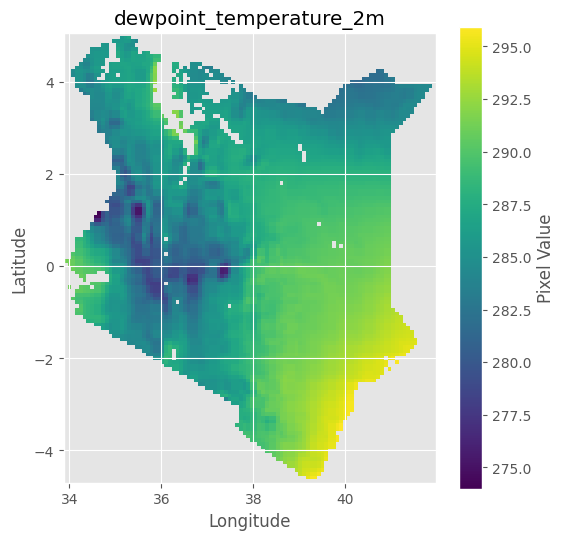


Processing: data/climate_data/climate_processed_data/new_gee_selected_months_era5land_clipped_split_folder/2022-01/leaf_area_index_low_vegetation.tif
raster src.nodata -9999.0


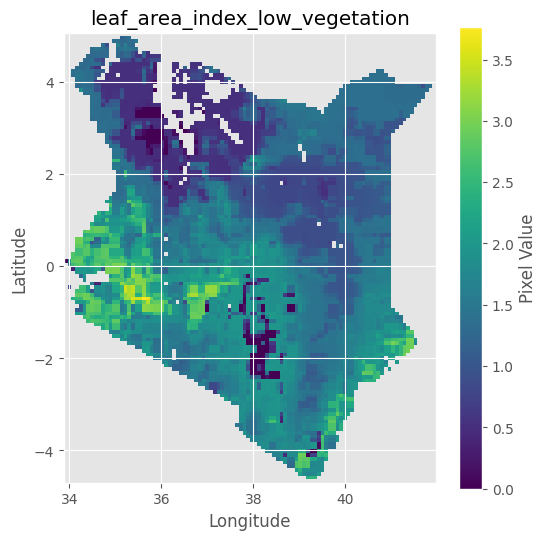


Processing: data/climate_data/climate_processed_data/new_gee_selected_months_era5land_clipped_split_folder/2022-01/soil_temperature_level_1.tif
raster src.nodata -9999.0


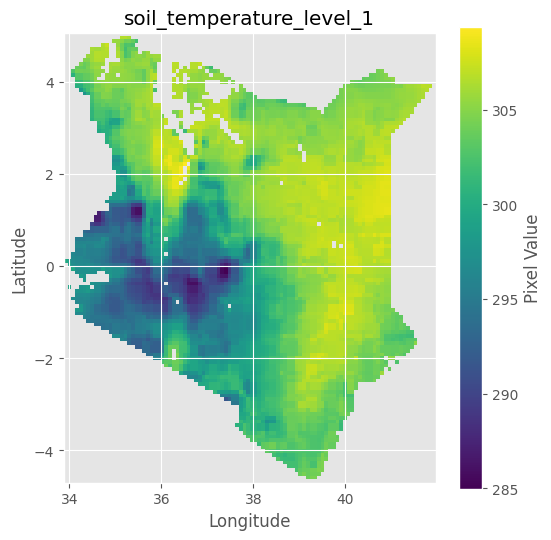

🔹 Folder provided. Pattern used: data/climate_data/climate_processed_data/new_gee_selected_months_era5land_clipped_split_folder/2022-01/*.tif
🗂️ Found 12 raster file(s).

📂 Processing: data/climate_data/climate_processed_data/new_gee_selected_months_era5land_clipped_split_folder/2022-01/temperature_2m.tif
   ↪ src.nodata: -9999.0
✅ raster_nodata is not None
🟢 Using src.nodata from metadata


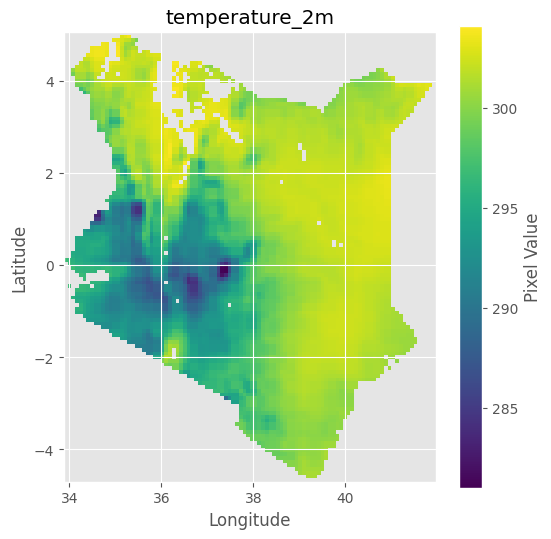


📂 Processing: data/climate_data/climate_processed_data/new_gee_selected_months_era5land_clipped_split_folder/2022-01/temperature_2m_min.tif
   ↪ src.nodata: -9999.0
✅ raster_nodata is not None
🟢 Using src.nodata from metadata


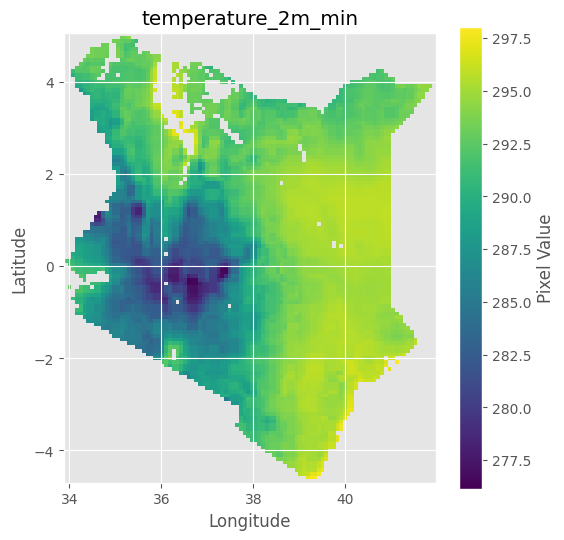


📂 Processing: data/climate_data/climate_processed_data/new_gee_selected_months_era5land_clipped_split_folder/2022-01/temperature_2m_max.tif
   ↪ src.nodata: -9999.0
✅ raster_nodata is not None
🟢 Using src.nodata from metadata


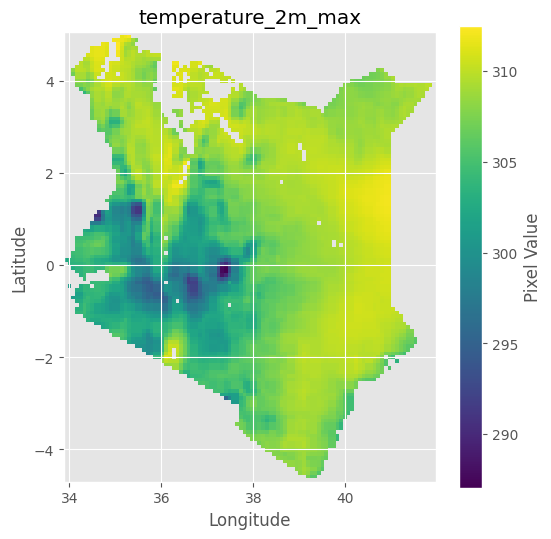


📂 Processing: data/climate_data/climate_processed_data/new_gee_selected_months_era5land_clipped_split_folder/2022-01/surface_pressure.tif
   ↪ src.nodata: -9999.0
✅ raster_nodata is not None
🟢 Using src.nodata from metadata


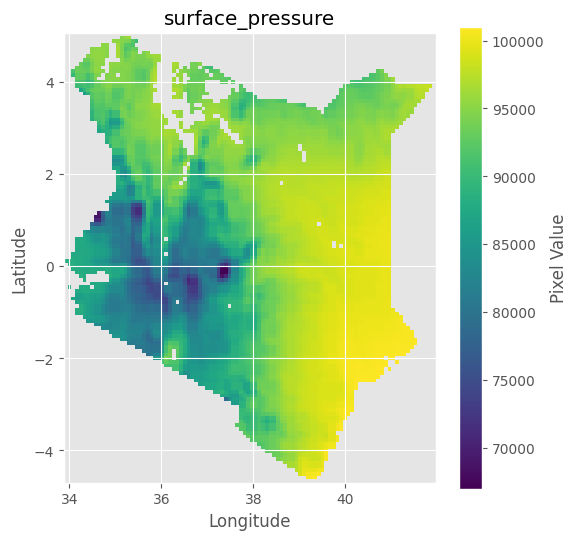


📂 Processing: data/climate_data/climate_processed_data/new_gee_selected_months_era5land_clipped_split_folder/2022-01/dewpoint_temperature_2m.tif
   ↪ src.nodata: -9999.0
✅ raster_nodata is not None
🟢 Using src.nodata from metadata


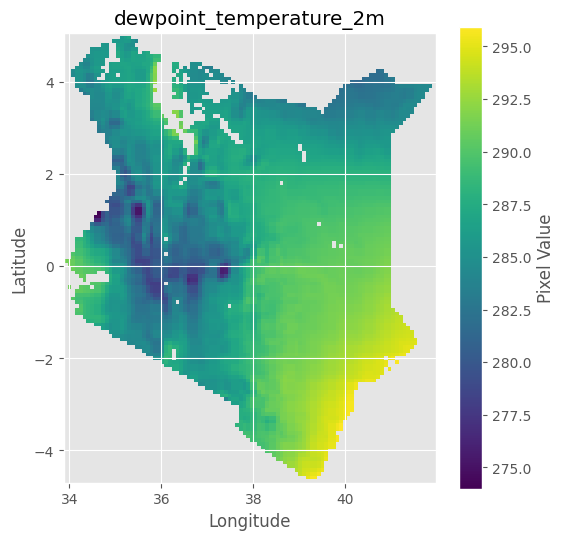


📂 Processing: data/climate_data/climate_processed_data/new_gee_selected_months_era5land_clipped_split_folder/2022-01/total_precipitation_sum.tif
   ↪ src.nodata: -9999.0
✅ raster_nodata is not None
🟢 Using src.nodata from metadata


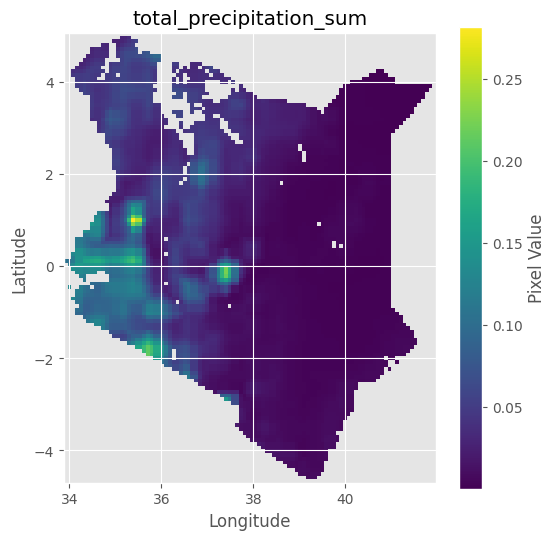


📂 Processing: data/climate_data/climate_processed_data/new_gee_selected_months_era5land_clipped_split_folder/2022-01/u_component_of_wind_10m.tif
   ↪ src.nodata: -9999.0
✅ raster_nodata is not None
🟢 Using src.nodata from metadata


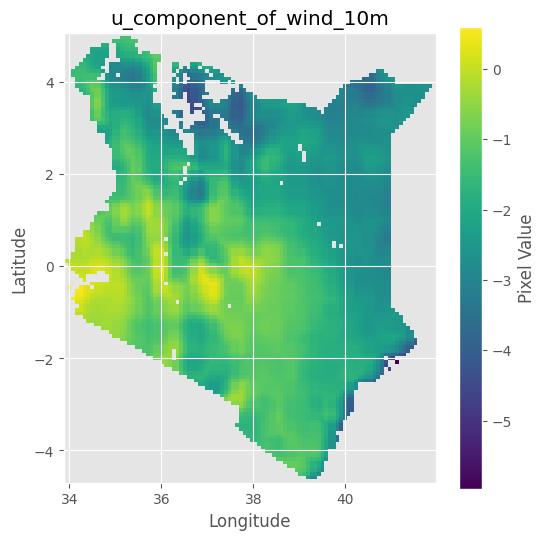


📂 Processing: data/climate_data/climate_processed_data/new_gee_selected_months_era5land_clipped_split_folder/2022-01/v_component_of_wind_10m.tif
   ↪ src.nodata: -9999.0
✅ raster_nodata is not None
🟢 Using src.nodata from metadata


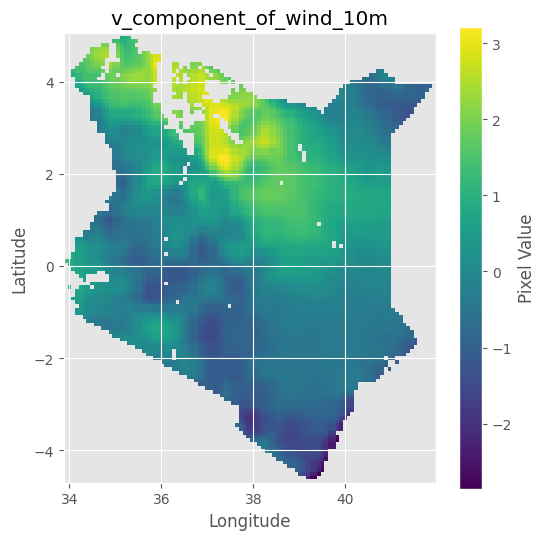


📂 Processing: data/climate_data/climate_processed_data/new_gee_selected_months_era5land_clipped_split_folder/2022-01/total_evaporation_sum.tif
   ↪ src.nodata: -9999.0
✅ raster_nodata is not None
🟢 Using src.nodata from metadata


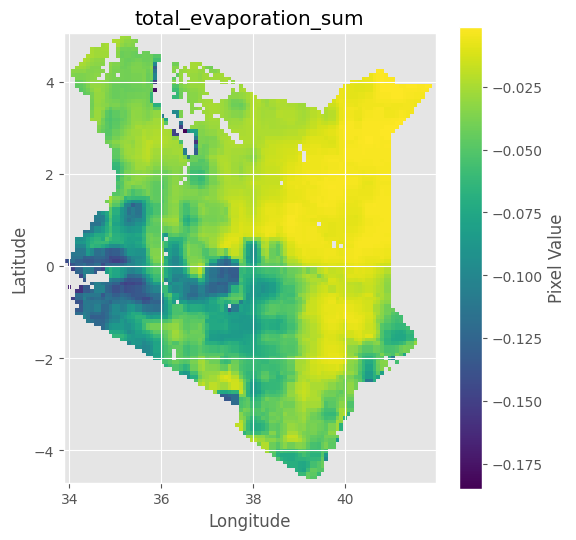


📂 Processing: data/climate_data/climate_processed_data/new_gee_selected_months_era5land_clipped_split_folder/2022-01/soil_temperature_level_1.tif
   ↪ src.nodata: -9999.0
✅ raster_nodata is not None
🟢 Using src.nodata from metadata


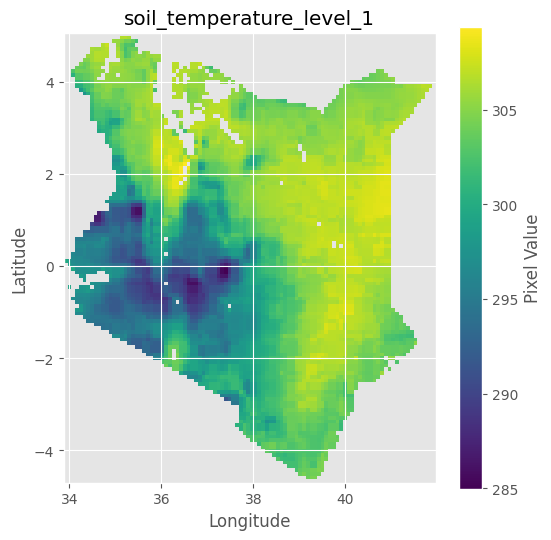


📂 Processing: data/climate_data/climate_processed_data/new_gee_selected_months_era5land_clipped_split_folder/2022-01/volumetric_soil_water_layer_1.tif
   ↪ src.nodata: -9999.0
✅ raster_nodata is not None
🟢 Using src.nodata from metadata


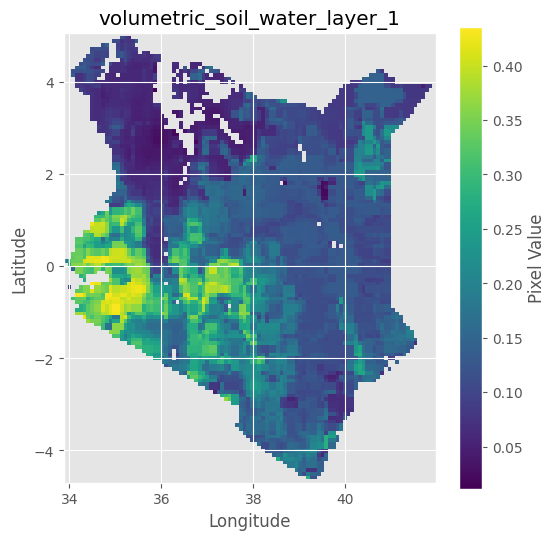


📂 Processing: data/climate_data/climate_processed_data/new_gee_selected_months_era5land_clipped_split_folder/2022-01/leaf_area_index_low_vegetation.tif
   ↪ src.nodata: -9999.0
✅ raster_nodata is not None
🟢 Using src.nodata from metadata


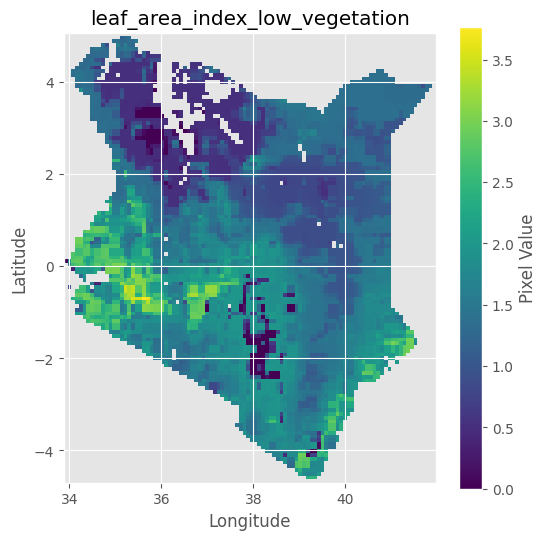

In [ ]:
#@title 2.4 check and visualise gee_selected_months_era5land_clipped

folder = 'data/climate_data/climate_processed_data/new_gee_selected_months_era5land_clipped_split_folder/2022-01'

tifs = sorted(glob(os.path.join(folder, '*.tif')))[:3]

for raster in tifs:
  print(raster)
  pc.check_raster_properties(raster, nodata_value=-9999) # Raster's official NoData value (if set): -9999

vc.visualise_rasters_lim(
    folder_path= folder,
    nodata_value=  -9999, output_folder='raster_plots/01', show_plot=True, save_plot=False, max_files=3
)

vc.visualise_rasters(
    path= folder,
    nodata_value=  -9999, output_folder='raster_plots/01', show_plot=True, save_plot=False
)

# Set 3: Longterm annual bioclimatic (clipped)

In [ ]:
#@title check files
drive_folder_path = 'data/climate_data/climate_processed_data/annual_longterm_wc2.1_30s_bio_clipped_tif'
pattern = f'{drive_folder_path}/*.tif'
raster_files = glob(pattern)
raster_files

In [ ]:
#@title setting nodata to be -9999 (run once)
# Elapid will throw error with the current nodata value (-3.3999999521443642e+38)

# check if there is pixels with -9999 in each of the raster in annual_longterm_wc2.1_30s_bio_clipped_tif

folder_path = 'data/climate_data/climate_processed_data/annual_longterm_wc2.1_30s_bio_clipped_tif'
check_value = -9999
raster_files = glob(os.path.join(folder_path, '*.tif'))
print(f"Checking raster files in: {folder_path} for pixels with value {check_value}")

for raster_path in raster_files:
    print(f"Checking: {os.path.basename(raster_path)}")
    try:
        with rasterio.open(raster_path) as src:
            # Read the data as a numpy array
            data = src.read(1)
            # Check if the nodata_check_value exists in the array
            if np.any(data == check_value):
                print(f"Found pixels with value {check_value} in {os.path.basename(raster_path)}")
                count = np.sum(data == check_value)
                print(f"Number of pixels with value {check_value}: {count}")
            else:
                print(f"✅ No pixels with value {check_value} found in {os.path.basename(raster_path)}")
    except rasterio.errors.RasterioIOError as e:
        print(f"Error opening raster file {raster_path}: {e}")
    except Exception as e:
        print(f"An unexpected error occurred while processing {raster_path}: {e}")
print("\nCheck complete.")

bioclim_ori_folder_path = 'data/climate_data/climate_processed_data/annual_longterm_wc2.1_30s_bio_clipped_tif'
save_to_folder='data/climate_data/climate_processed_data/annual_longterm_wc2.1_30s_bio_clipped_setnodata'
for tif in glob(os.path.join(f'{bioclim_ori_folder_path}/*.tif')):
  print(tif)
  pc.set_nodata_value_in_geotiff(tif, nodata_value=-9999, save_to_folder = save_to_folder)

data/climate_data/climate_processed_data/annual_longterm_wc2.1_30s_bio_clipped_setnodata/bio_19_prec_coldest_quarter.tif

--- Checking Raster: data/climate_data/climate_processed_data/annual_longterm_wc2.1_30s_bio_clipped_setnodata/bio_19_prec_coldest_quarter.tif ---
Pixel size (width, height): (0.008333333333, 0.008333333333)
Raster's official NoData value (if set): -9999.0
Using NoData value for counting: -9999.0
Total number of pixels: 1115112
Number of valid pixels: 656635
Percentage of valid pixels: 58.89%
--- End Check ---
data/climate_data/climate_processed_data/annual_longterm_wc2.1_30s_bio_clipped_setnodata/bio_04_temp_seasonality.tif

--- Checking Raster: data/climate_data/climate_processed_data/annual_longterm_wc2.1_30s_bio_clipped_setnodata/bio_04_temp_seasonality.tif ---
Pixel size (width, height): (0.008333333333, 0.008333333333)
Raster's official NoData value (if set): -9999.0
Using NoData value for counting: -9999.0
Total number of pixels: 1115112
Number of valid pixels

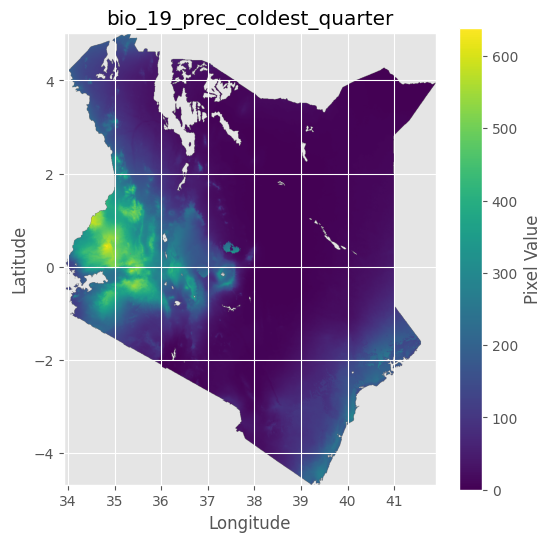


📂 Processing: data/climate_data/climate_processed_data/annual_longterm_wc2.1_30s_bio_clipped_setnodata/bio_04_temp_seasonality.tif
   ↪ src.nodata: -9999.0
✅ raster_nodata is not None
🟢 Using src.nodata from metadata


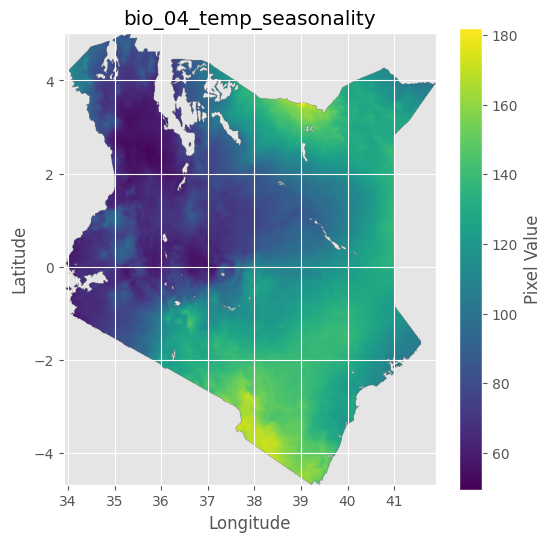


📂 Processing: data/climate_data/climate_processed_data/annual_longterm_wc2.1_30s_bio_clipped_setnodata/bio_02_mean_diurnal_range.tif
   ↪ src.nodata: -9999.0
✅ raster_nodata is not None
🟢 Using src.nodata from metadata


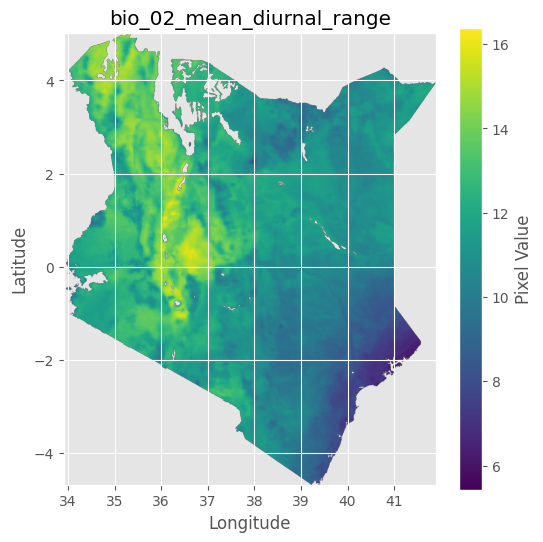


📂 Processing: data/climate_data/climate_processed_data/annual_longterm_wc2.1_30s_bio_clipped_setnodata/bio_03_isothermality.tif
   ↪ src.nodata: -9999.0
✅ raster_nodata is not None
🟢 Using src.nodata from metadata


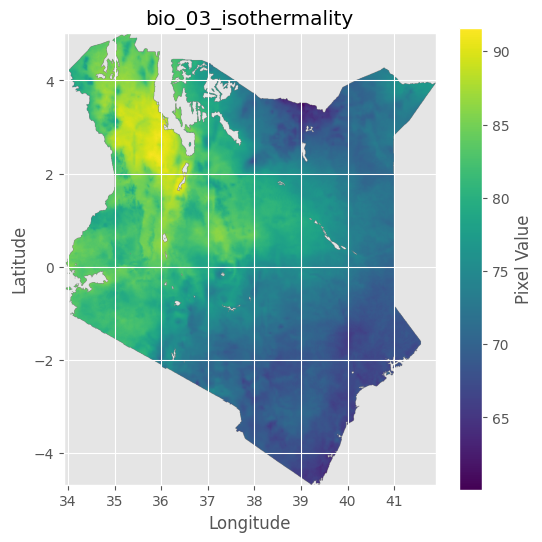


📂 Processing: data/climate_data/climate_processed_data/annual_longterm_wc2.1_30s_bio_clipped_setnodata/bio_12_annual_prec.tif
   ↪ src.nodata: -9999.0
✅ raster_nodata is not None
🟢 Using src.nodata from metadata


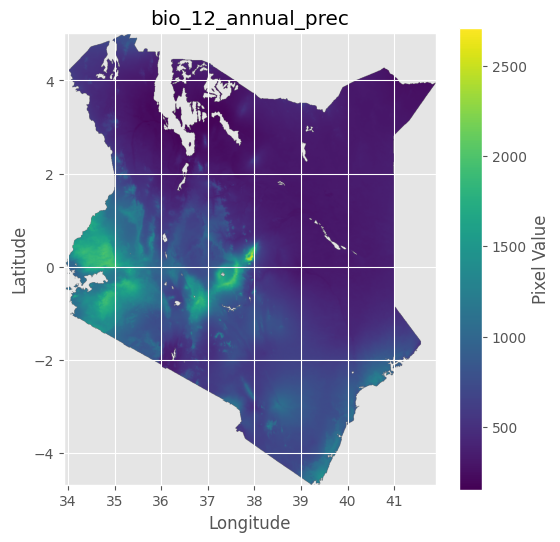


📂 Processing: data/climate_data/climate_processed_data/annual_longterm_wc2.1_30s_bio_clipped_setnodata/bio_15_prec_seasonality.tif
   ↪ src.nodata: -9999.0
✅ raster_nodata is not None
🟢 Using src.nodata from metadata


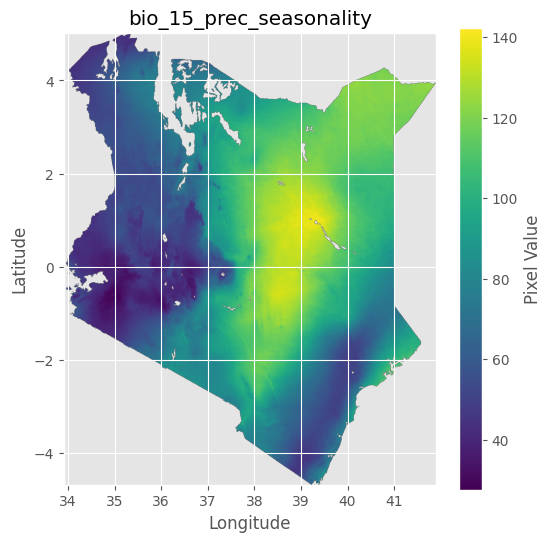


📂 Processing: data/climate_data/climate_processed_data/annual_longterm_wc2.1_30s_bio_clipped_setnodata/bio_08_mean_temp_wettest_quarter.tif
   ↪ src.nodata: -9999.0
✅ raster_nodata is not None
🟢 Using src.nodata from metadata


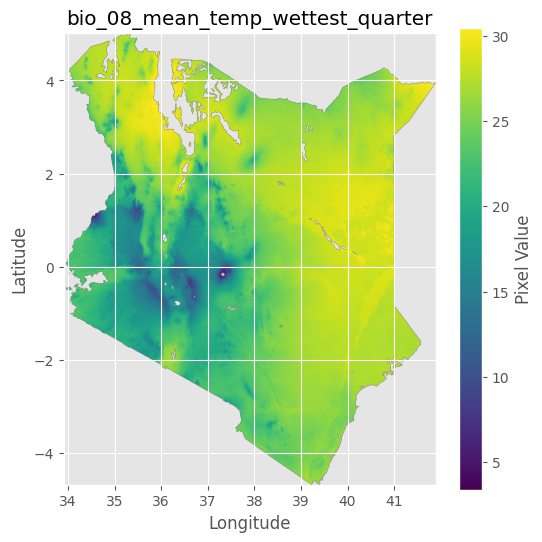


📂 Processing: data/climate_data/climate_processed_data/annual_longterm_wc2.1_30s_bio_clipped_setnodata/bio_13_prec_wettest_month.tif
   ↪ src.nodata: -9999.0
✅ raster_nodata is not None
🟢 Using src.nodata from metadata


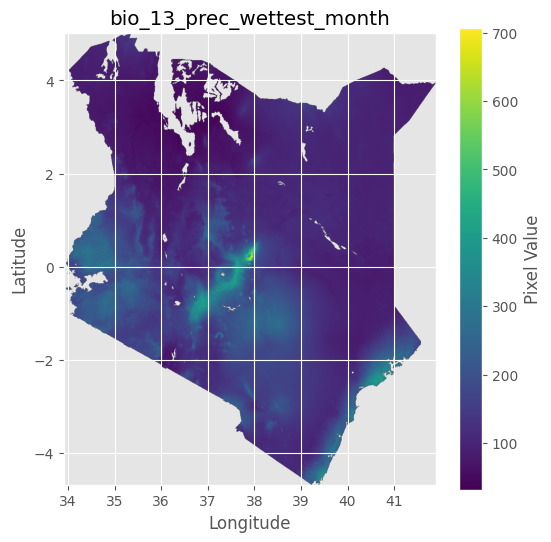


📂 Processing: data/climate_data/climate_processed_data/annual_longterm_wc2.1_30s_bio_clipped_setnodata/bio_17_prec_driest_quarter.tif
   ↪ src.nodata: -9999.0
✅ raster_nodata is not None
🟢 Using src.nodata from metadata


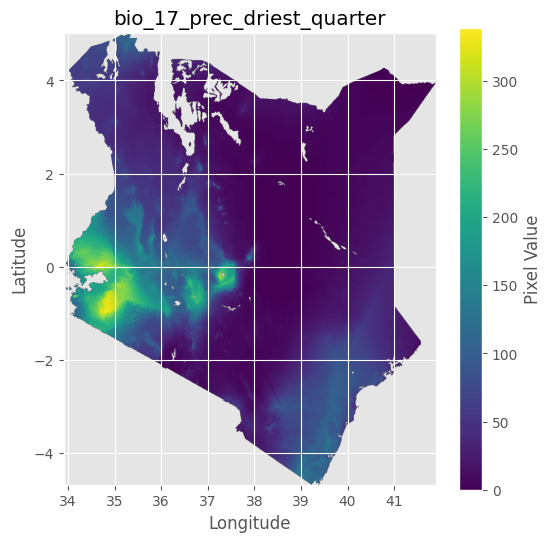


📂 Processing: data/climate_data/climate_processed_data/annual_longterm_wc2.1_30s_bio_clipped_setnodata/bio_09_mean_temp_driest_quarter.tif
   ↪ src.nodata: -9999.0
✅ raster_nodata is not None
🟢 Using src.nodata from metadata


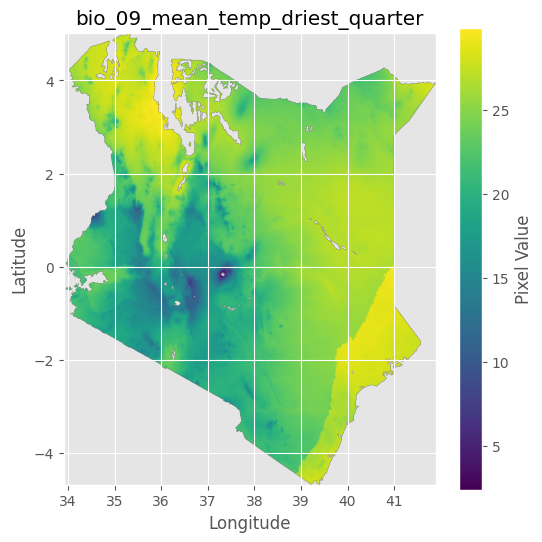


📂 Processing: data/climate_data/climate_processed_data/annual_longterm_wc2.1_30s_bio_clipped_setnodata/bio_10_mean_temp_warmest_quarter.tif
   ↪ src.nodata: -9999.0
✅ raster_nodata is not None
🟢 Using src.nodata from metadata


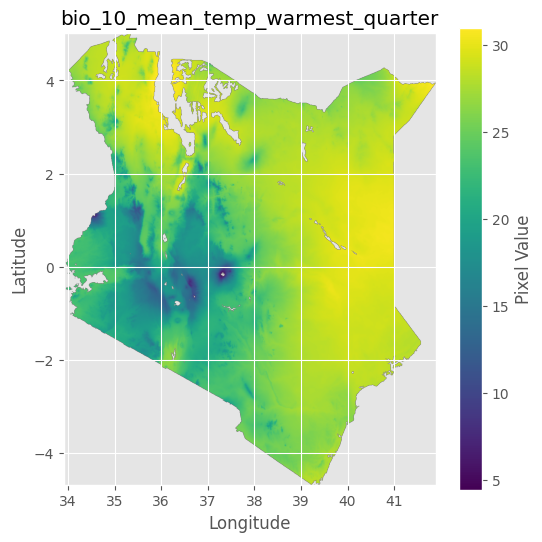


📂 Processing: data/climate_data/climate_processed_data/annual_longterm_wc2.1_30s_bio_clipped_setnodata/bio_01_annual_mean_temp.tif
   ↪ src.nodata: -9999.0
✅ raster_nodata is not None
🟢 Using src.nodata from metadata


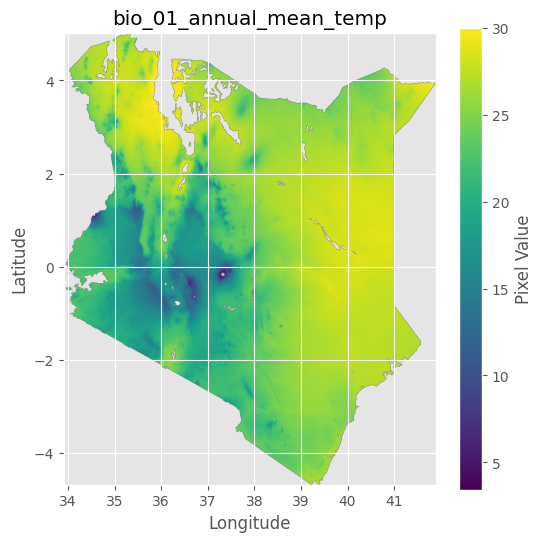


📂 Processing: data/climate_data/climate_processed_data/annual_longterm_wc2.1_30s_bio_clipped_setnodata/bio_14_prec_driest_month.tif
   ↪ src.nodata: -9999.0
✅ raster_nodata is not None
🟢 Using src.nodata from metadata


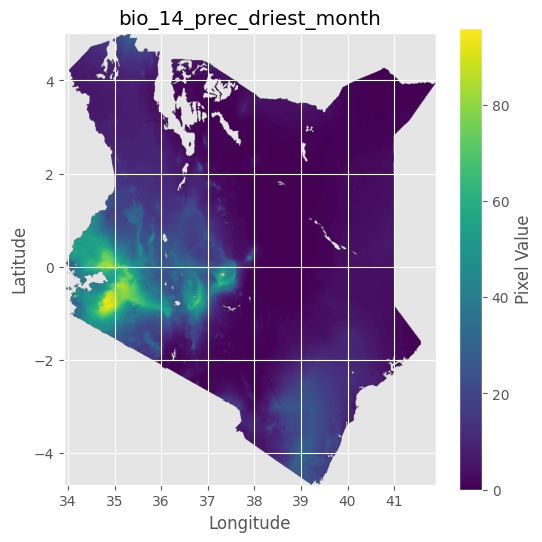


📂 Processing: data/climate_data/climate_processed_data/annual_longterm_wc2.1_30s_bio_clipped_setnodata/bio_16_prec_wettest_quarter.tif
   ↪ src.nodata: -9999.0
✅ raster_nodata is not None
🟢 Using src.nodata from metadata


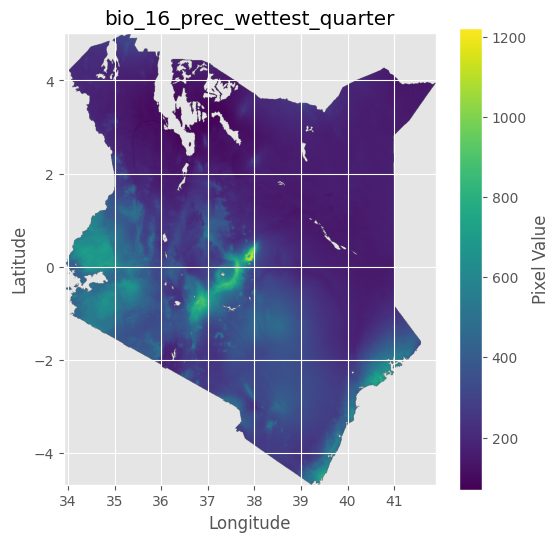


📂 Processing: data/climate_data/climate_processed_data/annual_longterm_wc2.1_30s_bio_clipped_setnodata/bio_06_min_temp_coldest_month.tif
   ↪ src.nodata: -9999.0
✅ raster_nodata is not None
🟢 Using src.nodata from metadata


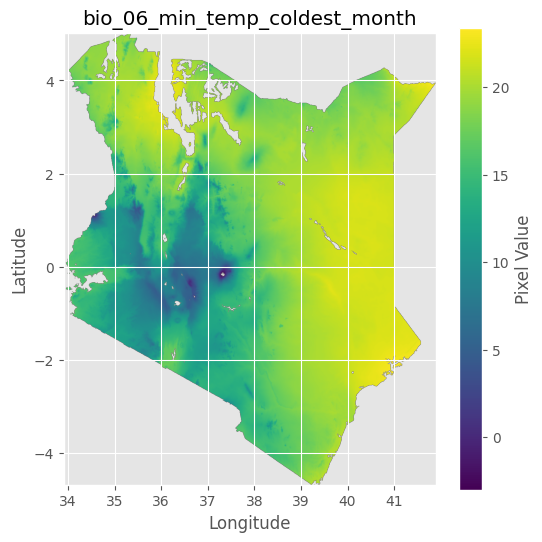


📂 Processing: data/climate_data/climate_processed_data/annual_longterm_wc2.1_30s_bio_clipped_setnodata/bio_18_prec_warmest_quarter.tif
   ↪ src.nodata: -9999.0
✅ raster_nodata is not None
🟢 Using src.nodata from metadata


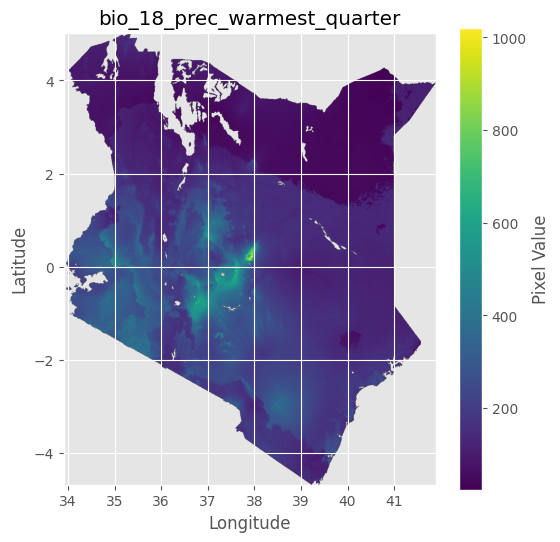


📂 Processing: data/climate_data/climate_processed_data/annual_longterm_wc2.1_30s_bio_clipped_setnodata/bio_11_mean_temp_coldest_quarter.tif
   ↪ src.nodata: -9999.0
✅ raster_nodata is not None
🟢 Using src.nodata from metadata


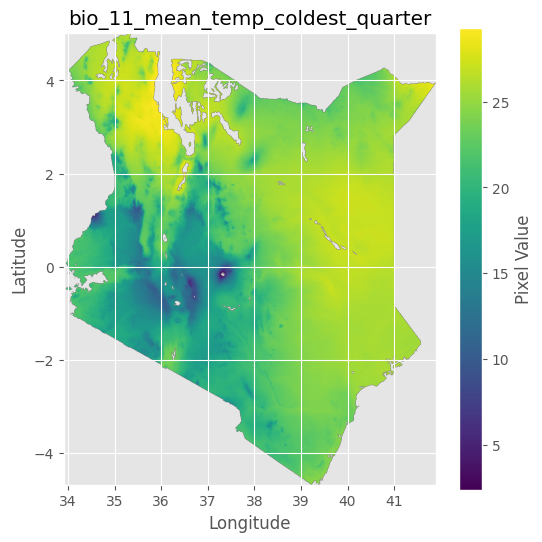


📂 Processing: data/climate_data/climate_processed_data/annual_longterm_wc2.1_30s_bio_clipped_setnodata/bio_05_max_temp_warmest_month.tif
   ↪ src.nodata: -9999.0
✅ raster_nodata is not None
🟢 Using src.nodata from metadata


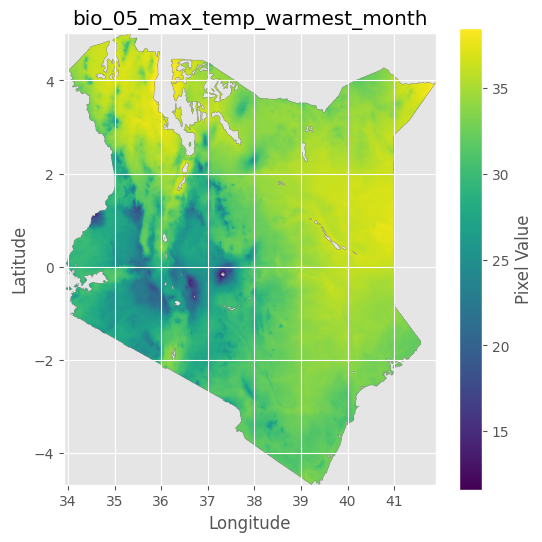


📂 Processing: data/climate_data/climate_processed_data/annual_longterm_wc2.1_30s_bio_clipped_setnodata/bio_07_temp_annual_range.tif
   ↪ src.nodata: -9999.0
✅ raster_nodata is not None
🟢 Using src.nodata from metadata


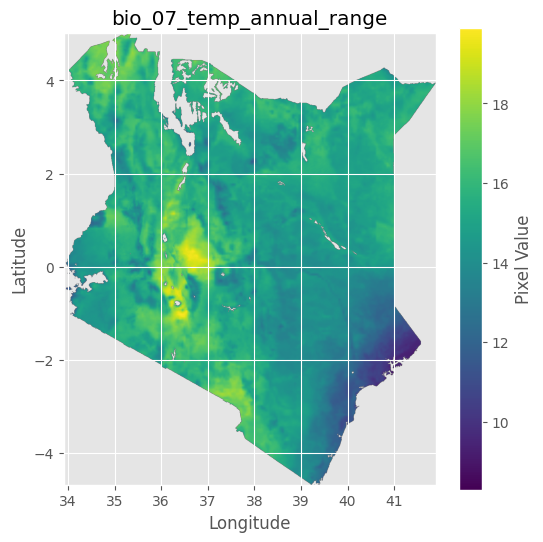

In [ ]:
#@title check and visualise annual_longterm_wc2.1_30s_bio_clipped_setnodata

folder = 'data/climate_data/climate_processed_data/annual_longterm_wc2.1_30s_bio_clipped_setnodata'
for raster in glob(os.path.join(f'{folder}/*.tif')):
  print(raster)
  pc.check_raster_properties(raster) # Raster's official NoData value (if set):

vc.visualise_rasters(
    path=folder, output_folder='raster_plots/01', show_plot=True, save_plot=False
)

# Set 4 - 5: Longterm Monthly tmin, tmax, tavg, srad, wind, vapr, prec  (clipped)

In [ ]:
#@title check files

drive_folder_path = 'data/climate_data/climate_processed_data/monthly_longterm_wc2.1_2.5min_clipped_tif'

# Use ** and recursive=True
pattern = f'{drive_folder_path}/**/*.tif'
raster_files = glob(pattern, recursive=True)

print(f"Found {len(raster_files)} .tif files, example below:")
raster_files[:10]


drive_folder_path = 'data/climate_data/climate_processed_data/monthly_longterm_wc2.1_2.5min_clipped_allmonth_mean'
pattern = f'{drive_folder_path}/*.tif'
raster_files = glob(pattern)
print(f"Found {len(raster_files)} .tif files, example below:")
raster_files

Found 84 .tif files, example below:


['data/climate_data/climate_processed_data/monthly_longterm_wc2.1_2.5min_clipped_tif/monthly_tavg/wc2.1_30s_tavg_01.tif',
 'data/climate_data/climate_processed_data/monthly_longterm_wc2.1_2.5min_clipped_tif/monthly_tavg/wc2.1_30s_tavg_02.tif',
 'data/climate_data/climate_processed_data/monthly_longterm_wc2.1_2.5min_clipped_tif/monthly_tavg/wc2.1_30s_tavg_03.tif',
 'data/climate_data/climate_processed_data/monthly_longterm_wc2.1_2.5min_clipped_tif/monthly_tavg/wc2.1_30s_tavg_04.tif',
 'data/climate_data/climate_processed_data/monthly_longterm_wc2.1_2.5min_clipped_tif/monthly_tavg/wc2.1_30s_tavg_05.tif',
 'data/climate_data/climate_processed_data/monthly_longterm_wc2.1_2.5min_clipped_tif/monthly_tavg/wc2.1_30s_tavg_06.tif',
 'data/climate_data/climate_processed_data/monthly_longterm_wc2.1_2.5min_clipped_tif/monthly_tavg/wc2.1_30s_tavg_07.tif',
 'data/climate_data/climate_processed_data/monthly_longterm_wc2.1_2.5min_clipped_tif/monthly_tavg/wc2.1_30s_tavg_08.tif',
 'data/climate_data/clim

In [ ]:
#@title (run once) split folder

# # run only once: group_raster_by_month to match how ae.annotate_by_month() works
# pc.group_raster_by_month(input_folder='data/climate_data/climate_processed_data/monthly_longterm_wc2.1_2.5min_clipped_tif', output_folder= 'data/climate_data/climate_processed_data/monthly_longterm_wc2.1_2.5min_clipped_split_folder')

✅ wc2.1_30s_tavg_01.tif ➡️ 01/
✅ wc2.1_30s_tavg_02.tif ➡️ 02/
✅ wc2.1_30s_tavg_03.tif ➡️ 03/
✅ wc2.1_30s_tavg_04.tif ➡️ 04/
✅ wc2.1_30s_tavg_05.tif ➡️ 05/
✅ wc2.1_30s_tavg_06.tif ➡️ 06/
✅ wc2.1_30s_tavg_07.tif ➡️ 07/
✅ wc2.1_30s_tavg_08.tif ➡️ 08/
✅ wc2.1_30s_tavg_09.tif ➡️ 09/
✅ wc2.1_30s_tavg_10.tif ➡️ 10/
✅ wc2.1_30s_tavg_11.tif ➡️ 11/
✅ wc2.1_30s_tavg_12.tif ➡️ 12/
✅ wc2.1_30s_srad_01.tif ➡️ 01/
✅ wc2.1_30s_srad_02.tif ➡️ 02/
✅ wc2.1_30s_srad_03.tif ➡️ 03/
✅ wc2.1_30s_srad_04.tif ➡️ 04/
✅ wc2.1_30s_srad_05.tif ➡️ 05/
✅ wc2.1_30s_srad_06.tif ➡️ 06/
✅ wc2.1_30s_srad_07.tif ➡️ 07/
✅ wc2.1_30s_srad_08.tif ➡️ 08/
✅ wc2.1_30s_srad_09.tif ➡️ 09/
✅ wc2.1_30s_srad_10.tif ➡️ 10/
✅ wc2.1_30s_srad_11.tif ➡️ 11/
✅ wc2.1_30s_srad_12.tif ➡️ 12/
✅ wc2.1_30s_tmax_01.tif ➡️ 01/
✅ wc2.1_30s_tmax_03.tif ➡️ 03/
✅ wc2.1_30s_tmax_04.tif ➡️ 04/
✅ wc2.1_30s_tmax_05.tif ➡️ 05/
✅ wc2.1_30s_tmax_06.tif ➡️ 06/
✅ wc2.1_30s_tmax_07.tif ➡️ 07/
✅ wc2.1_30s_tmax_08.tif ➡️ 08/
✅ wc2.1_30s_tmax_09.tif ➡️ 09/
✅ wc2.1_

In [ ]:
#@title check files in split_folder

drive_folder_path = 'data/climate_data/climate_processed_data/monthly_longterm_wc2.1_2.5min_clipped_split_folder'

# Use ** and recursive=True
pattern = f'{drive_folder_path}/**/*.tif'
raster_files = glob(pattern, recursive=True)

print(f"Found {len(raster_files)} .tif files, example below:")
raster_files[:10]

Found 84 .tif files, example below:


['data/climate_data/climate_processed_data/monthly_longterm_wc2.1_2.5min_clipped_split_folder/01/wc2.1_30s_vapr_01.tif',
 'data/climate_data/climate_processed_data/monthly_longterm_wc2.1_2.5min_clipped_split_folder/01/wc2.1_30s_prec_01.tif',
 'data/climate_data/climate_processed_data/monthly_longterm_wc2.1_2.5min_clipped_split_folder/01/wc2.1_30s_tavg_01.tif',
 'data/climate_data/climate_processed_data/monthly_longterm_wc2.1_2.5min_clipped_split_folder/01/wc2.1_30s_tmax_01.tif',
 'data/climate_data/climate_processed_data/monthly_longterm_wc2.1_2.5min_clipped_split_folder/01/wc2.1_30s_tmin_01.tif',
 'data/climate_data/climate_processed_data/monthly_longterm_wc2.1_2.5min_clipped_split_folder/01/wc2.1_30s_wind_01.tif',
 'data/climate_data/climate_processed_data/monthly_longterm_wc2.1_2.5min_clipped_split_folder/01/wc2.1_30s_srad_01.tif',
 'data/climate_data/climate_processed_data/monthly_longterm_wc2.1_2.5min_clipped_split_folder/02/wc2.1_30s_vapr_02.tif',
 'data/climate_data/climate_proc

🔹 Folder provided. Pattern used: data/climate_data/climate_processed_data/monthly_longterm_wc2.1_2.5min_clipped_split_folder/01/*.tif
🗂️ Found 7 raster file(s).

📂 Processing: data/climate_data/climate_processed_data/monthly_longterm_wc2.1_2.5min_clipped_split_folder/01/wc2.1_30s_vapr_01.tif
   ↪ src.nodata: -3.3999999521443642e+38
✅ raster_nodata is not None
🟢 Using src.nodata from metadata


/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:777: RuntimeWarning: overflow encountered in multiply
  xa *= self.N


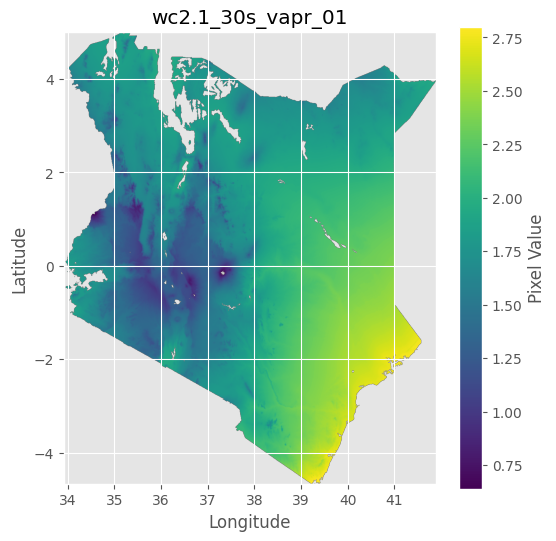


📂 Processing: data/climate_data/climate_processed_data/monthly_longterm_wc2.1_2.5min_clipped_split_folder/01/wc2.1_30s_prec_01.tif
   ↪ src.nodata: -32768.0
✅ raster_nodata is not None
🟢 Using src.nodata from metadata


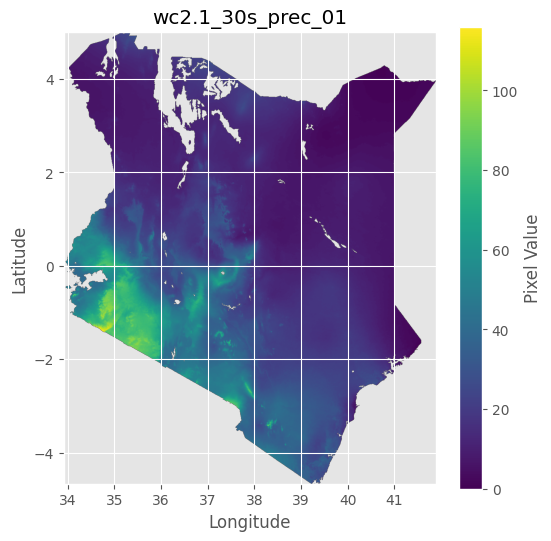


📂 Processing: data/climate_data/climate_processed_data/monthly_longterm_wc2.1_2.5min_clipped_split_folder/01/wc2.1_30s_tavg_01.tif
   ↪ src.nodata: -3.3999999521443642e+38
✅ raster_nodata is not None
🟢 Using src.nodata from metadata


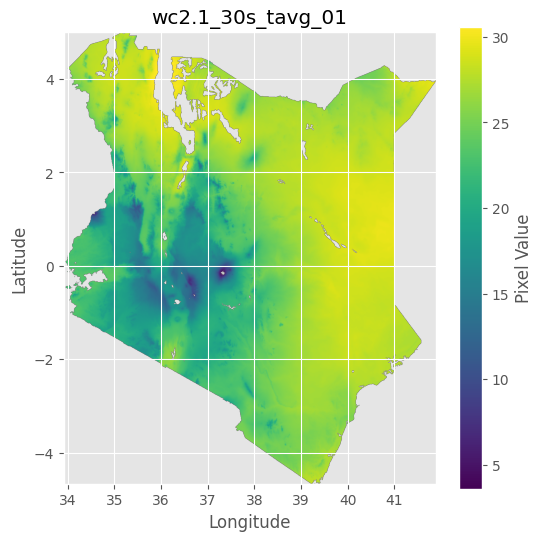


📂 Processing: data/climate_data/climate_processed_data/monthly_longterm_wc2.1_2.5min_clipped_split_folder/01/wc2.1_30s_tmax_01.tif
   ↪ src.nodata: -3.3999999521443642e+38
✅ raster_nodata is not None
🟢 Using src.nodata from metadata


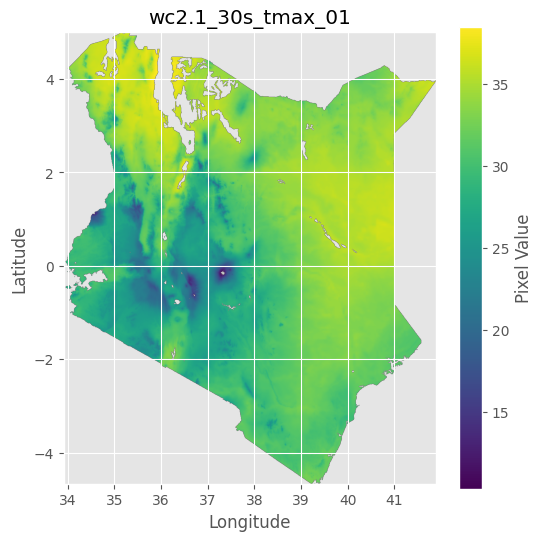


📂 Processing: data/climate_data/climate_processed_data/monthly_longterm_wc2.1_2.5min_clipped_split_folder/01/wc2.1_30s_tmin_01.tif
   ↪ src.nodata: -3.3999999521443642e+38
✅ raster_nodata is not None
🟢 Using src.nodata from metadata


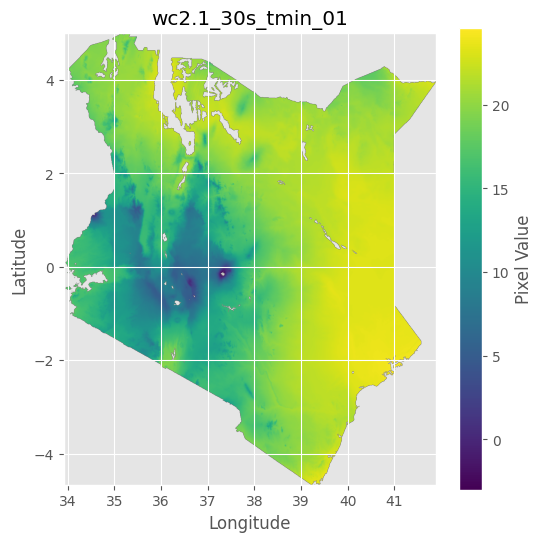


📂 Processing: data/climate_data/climate_processed_data/monthly_longterm_wc2.1_2.5min_clipped_split_folder/01/wc2.1_30s_wind_01.tif
   ↪ src.nodata: -3.3999999521443642e+38
✅ raster_nodata is not None
🟢 Using src.nodata from metadata


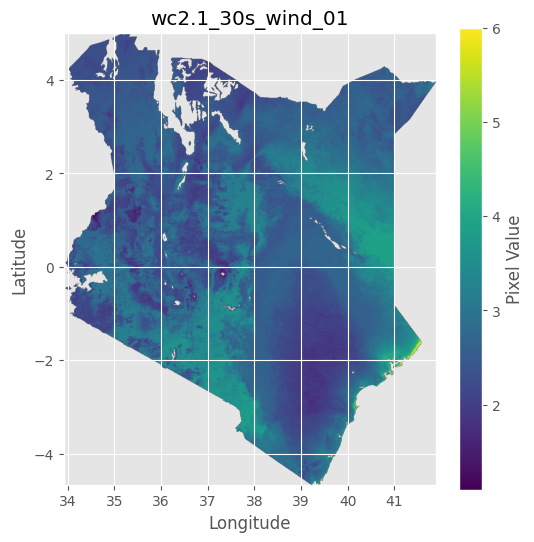


📂 Processing: data/climate_data/climate_processed_data/monthly_longterm_wc2.1_2.5min_clipped_split_folder/01/wc2.1_30s_srad_01.tif
   ↪ src.nodata: 65535.0
✅ raster_nodata is not None
🟢 Using src.nodata from metadata


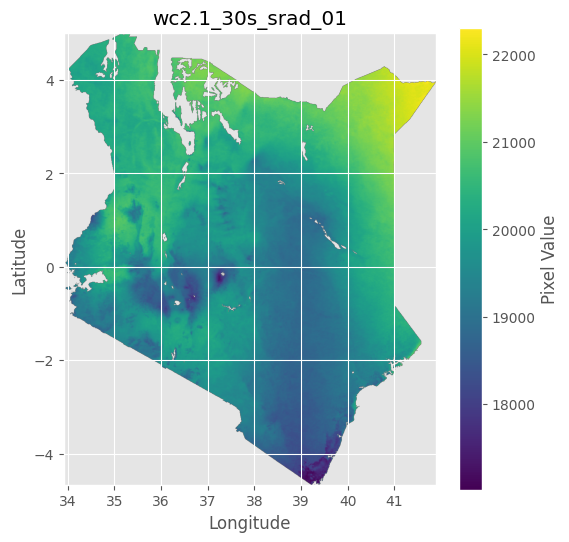

In [ ]:
#@title check and visualise monthly_longterm_wc2.1_2.5min_clipped_split_folder/01

vc.visualise_rasters(
    path='data/climate_data/climate_processed_data/monthly_longterm_wc2.1_2.5min_clipped_split_folder/01',
    output_folder='raster_plots/01', show_plot=True, save_plot=False
)

In [ ]:
#@title check and visualise monthly_longterm_wc2.1_2.5min_clipped_allmonth_mean

vc.visualise_rasters(
    path='data/climate_data/climate_processed_data/monthly_longterm_wc2.1_2.5min_clipped_allmonth_mean',
    output_folder='raster_plots', show_plot=True, save_plot=False
)

In [ ]:
#@title setting nodata to be -9999 (run once)

# check if there is pixels with -9999 in each of the raster in monthly_longterm_wc2.1_2.5min_clipped_split_folder

folder_path = 'data/climate_data/climate_processed_data/annual_longterm_wc2.1_30s_bio_clipped_tif'
check_value = -9999
raster_files = glob(os.path.join(folder_path, '*.tif'))
print(f"Checking raster files in: {folder_path} for pixels with value {check_value}")

for raster_path in raster_files:
    print(f"Checking: {os.path.basename(raster_path)}")
    try:
        with rasterio.open(raster_path) as src:
            # Read the data as a numpy array
            data = src.read(1)
            # Check if the nodata_check_value exists in the array
            if np.any(data == check_value):
                print(f"Found pixels with value {check_value} in {os.path.basename(raster_path)}")
                count = np.sum(data == check_value)
                print(f"Number of pixels with value {check_value}: {count}")
            else:
                print(f"✅ No pixels with value {check_value} found in {os.path.basename(raster_path)}")
    except rasterio.errors.RasterioIOError as e:
        print(f"Error opening raster file {raster_path}: {e}")
    except Exception as e:
        print(f"An unexpected error occurred while processing {raster_path}: {e}")
print("\nCheck complete.")

# The same to be done with files in the folder monthly_longterm_wc2.1_2.5min_clipped_allmonth_mean

Checking raster files in: data/climate_data/climate_processed_data/annual_longterm_wc2.1_30s_bio_clipped_tif for pixels with value -9999
Checking: bio_19_prec_coldest_quarter.tif
✅ No pixels with value -9999 found in bio_19_prec_coldest_quarter.tif
Checking: bio_04_temp_seasonality.tif
✅ No pixels with value -9999 found in bio_04_temp_seasonality.tif
Checking: bio_02_mean_diurnal_range.tif
✅ No pixels with value -9999 found in bio_02_mean_diurnal_range.tif
Checking: bio_03_isothermality.tif
✅ No pixels with value -9999 found in bio_03_isothermality.tif
Checking: bio_12_annual_prec.tif
✅ No pixels with value -9999 found in bio_12_annual_prec.tif
Checking: bio_15_prec_seasonality.tif
✅ No pixels with value -9999 found in bio_15_prec_seasonality.tif
Checking: bio_08_mean_temp_wettest_quarter.tif
✅ No pixels with value -9999 found in bio_08_mean_temp_wettest_quarter.tif
Checking: bio_13_prec_wettest_month.tif
✅ No pixels with value -9999 found in bio_13_prec_wettest_month.tif
Checking: bio

In [ ]:
for month in range(1, 13):
  print(f"{month:02d}")
  monthly_ori_folder_path = f'data/climate_data/climate_processed_data/monthly_longterm_wc2.1_2.5min_clipped_split_folder/{month:02d}'
  save_to_folder=f'data/climate_data/climate_processed_data/monthly_longterm_wc2.1_2.5min_clipped_split_folder_setnodata/{month:02d}'
  for tif in glob(os.path.join(f'{monthly_ori_folder_path}/*.tif')):
    print(tif)
    # print('\nBefore')
    # pc.check_raster_properties(tif)
    pc.set_nodata_value_in_geotiff(tif, nodata_value=-9999, save_to_folder = save_to_folder)
    print('\nAfter')
    # pc.check_raster_properties(tif)

01
data/climate_data/climate_processed_data/monthly_longterm_wc2.1_2.5min_clipped_split_folder/01/wc2.1_30s_vapr_01.tif
✅ NoData value updated and saved to: data/climate_data/climate_processed_data/monthly_longterm_wc2.1_2.5min_clipped_split_folder_setnodata/01/wc2.1_30s_vapr_01.tif

After
data/climate_data/climate_processed_data/monthly_longterm_wc2.1_2.5min_clipped_split_folder/01/wc2.1_30s_prec_01.tif
✅ NoData value updated and saved to: data/climate_data/climate_processed_data/monthly_longterm_wc2.1_2.5min_clipped_split_folder_setnodata/01/wc2.1_30s_prec_01.tif

After
data/climate_data/climate_processed_data/monthly_longterm_wc2.1_2.5min_clipped_split_folder/01/wc2.1_30s_tavg_01.tif
✅ NoData value updated and saved to: data/climate_data/climate_processed_data/monthly_longterm_wc2.1_2.5min_clipped_split_folder_setnodata/01/wc2.1_30s_tavg_01.tif

After
data/climate_data/climate_processed_data/monthly_longterm_wc2.1_2.5min_clipped_split_folder/01/wc2.1_30s_tmax_01.tif
✅ NoData value u